# CHAPTER 1: DEFINITIONS, PROBLEM STATEMENT AND BASIC EXPLORATORY DATA ANALYSIS

## COMPANY OVERVIEW AND CONTEXT

> India's leading `intra-city logistics` company has transformed the delivery sector with innovative, technology-driven solutions. Serving over `5 million customers` across `19 cities`, the company empowers `1,50,000+ driver-partners` with consistent earnings, flexible working hours, and community benefits. By addressing inefficiencies in `last-mile logistics`, it connects businesses and customers seamlessly, enhancing operational productivity and customer satisfaction.  

## PROBLEM STATEMENT

> `Efficient delivery time prediction` is crucial for maintaining `customer satisfaction` and `optimizing logistics operations`. Using a comprehensive dataset, the goal is to `develop a regression based neural network model to accurately estimate delivery times`. This project will uncover insights into delivery dynamics, identify bottlenecks, and drive efficiency improvements while offering valuable experience in predictive modeling and data-driven decision-making.

## IMPORTING THE LIBRARIES AND DATASET

### Importing all the required libraries

In [ ]:
!apt-get install -y graphviz -q
!pip install pydot -q 

In [ ]:
!pip install --upgrade jax keras tensorflow keras_tuner scikit-learn -q

In [ ]:
!pip install --upgrade tensorboard -q

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import warnings, zipfile, io, requests, pickle, math, time, pydot, graphviz
from google.colab import userdata
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
from sklearn.neighbors import LocalOutlierFactor
import xgboost as xgb
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
import keras_tuner as kt
from keras_tuner import HyperModel
from keras_tuner import HyperParameters as hp
from keras_tuner import RandomSearch
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import LearningRateScheduler,TensorBoard,ReduceLROnPlateau,EarlyStopping
from IPython.display import Image
from scipy import stats
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from scipy.stats import randint, uniform
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor


ModuleNotFoundError: No module named 'google.colab'

### Importing the Dataset

In [ ]:
# URL of the .zip file
url = userdata.get('NN_Logistics_Dataset_URL')

# Download the file from the URL
response = requests.get(url)
if response.status_code == 200:
    # Use BytesIO to simulate a file object for zipfile
    with zipfile.ZipFile(io.BytesIO(response.content)) as zf:
        # List files in the zip (use this if you are unsure about the name of the CSV file)
        print("Files in zip:", zf.namelist())

        # Assuming the zip contains a CSV, load the first one (you can specify a filename if needed)
        csv_file = zf.namelist()[0]  # Adjust index as per your desired file
        with zf.open(csv_file) as file:
            # Load the CSV data into a pandas DataFrame
            data = pd.read_csv(file)
        print("Successfully Downloaded Data")
else:
    print("Failed to download file, status code:", response.status_code)

In [5]:
data = pd.read_csv("/kaggle/input/dataset/dataset.csv")

In [7]:
data.head(5)

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,1.0,2015-02-06 22:24:17,2015-02-06 23:27:16,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,2.0,2015-02-10 21:49:25,2015-02-10 22:56:29,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,3.0,2015-01-22 20:39:28,2015-01-22 21:09:09,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,3.0,2015-02-03 21:21:45,2015-02-03 22:13:00,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,3.0,2015-02-15 02:40:36,2015-02-15 03:20:26,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,6.0,9.0


### Description regarding each column of the dataset

| Column Name               | Description                                                                 |
|----------------------------|-----------------------------------------------------------------------------|
| **market_id**             | An integer ID indicating the market area of the restaurant                  |
| **created_at**            | Timestamp of when the order was placed                                     |
| **actual_delivery_time**  | Timestamp of when the order was delivered                                  |
| **store_id**  | Encrypted store id |
| **store_primary_category** | Category classification of the restaurant                                  |
| **order_protocol**        | Numeric code representing the mode of order placement (e.g., through Porter, direct call, pre-booking, third-party platform) |
| **total_items**  | The total number of items in the order |
| **subtotal**  | The final price of the order before taxes and fees |
| **num_distinct_items**    | Count of different items in the order                                      |
| **min_item_price**        | Price of the least expensive item in the order                             |
| **max_item_price**        | Price of the most expensive item in the order                              |
| **total_onshift_partners**| Number of delivery partners on duty when the order was placed              |
| **total_busy_partners**   | Number of delivery partners busy with other tasks at the order placement time |
| **total_outstanding_orders** | Total count of orders pending at the time                                 |


## ANALYSING BASIC METRICS OF DATASET

### Shape of the data

In [8]:
print(f"Number of rows in the dataset = {data.shape[0]}")
print(f"Number of columns in the dataset = {data.shape[1]}")

Number of rows in the dataset = 197428
Number of columns in the dataset = 14


### Datatypes of all the attributes

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197428 entries, 0 to 197427
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   market_id                 196441 non-null  float64
 1   created_at                197428 non-null  object 
 2   actual_delivery_time      197421 non-null  object 
 3   store_id                  197428 non-null  object 
 4   store_primary_category    192668 non-null  object 
 5   order_protocol            196433 non-null  float64
 6   total_items               197428 non-null  int64  
 7   subtotal                  197428 non-null  int64  
 8   num_distinct_items        197428 non-null  int64  
 9   min_item_price            197428 non-null  int64  
 10  max_item_price            197428 non-null  int64  
 11  total_onshift_partners    181166 non-null  float64
 12  total_busy_partners       181166 non-null  float64
 13  total_outstanding_orders  181166 non-null  f

### Conversion of `created_at and actual_delivery_time` from object dtype to datetime64 dtype

In [10]:
data["created_at"]=pd.to_datetime(data["created_at"])
data["actual_delivery_time"]=pd.to_datetime(data["actual_delivery_time"])

In [11]:
data.dtypes

market_id                          float64
created_at                  datetime64[ns]
actual_delivery_time        datetime64[ns]
store_id                            object
store_primary_category              object
order_protocol                     float64
total_items                          int64
subtotal                             int64
num_distinct_items                   int64
min_item_price                       int64
max_item_price                       int64
total_onshift_partners             float64
total_busy_partners                float64
total_outstanding_orders           float64
dtype: object

### Missing value or Null Value Detection

In [12]:
# Null value count
data.isnull().sum()

market_id                     987
created_at                      0
actual_delivery_time            7
store_id                        0
store_primary_category       4760
order_protocol                995
total_items                     0
subtotal                        0
num_distinct_items              0
min_item_price                  0
max_item_price                  0
total_onshift_partners      16262
total_busy_partners         16262
total_outstanding_orders    16262
dtype: int64

In [13]:
# Filtering the columns which have zero null values and sorting in descending order
def missing_data(data):
    total_missing_data = data.isna().sum().sort_values(ascending = False)
    percentage_missing_data = ((data.isna().sum()/len(data)*100)).sort_values(ascending = False)
    missingdata = pd.concat([total_missing_data, percentage_missing_data],axis = 1, keys=['Total', 'Percent'])
    return missingdata


missing_data = missing_data(data)
missing_data[missing_data["Total"]>0]

,Total,Percent
total_outstanding_orders,16262,8.236927
total_busy_partners,16262,8.236927
total_onshift_partners,16262,8.236927
store_primary_category,4760,2.411006
order_protocol,995,0.503981
market_id,987,0.499929
actual_delivery_time,7,0.003546


### Descriptive Statistics regarding each column of dataset

In [14]:
data.describe()

,market_id,created_at,actual_delivery_time,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
count,196441.000000,197428,197421,196433.000000,197428.000000,197428.000000,197428.000000,197428.000000,197428.000000,181166.000000,181166.000000,181166.000000
mean,2.978706,2015-02-04 22:00:09.537962752,2015-02-04 22:48:23.348914432,2.882352,3.196391,2682.331402,2.670791,686.218470,1159.588630,44.808093,41.739747,58.050065
min,1.000000,2014-10-19 05:24:15,2015-01-21 15:58:11,1.000000,1.000000,0.000000,1.000000,-86.000000,0.000000,-4.000000,-5.000000,-6.000000
25%,2.000000,2015-01-29 02:32:42,2015-01-29 03:22:29,1.000000,2.000000,1400.000000,1.000000,299.000000,800.000000,17.000000,15.000000,17.000000
50%,3.000000,2015-02-05 03:29:09.500000,2015-02-05 04:40:41,3.000000,3.000000,2200.000000,2.000000,595.000000,1095.000000,37.000000,34.000000,41.000000
75%,4.000000,2015-02-12 01:39:18.500000,2015-02-12 02:25:26,4.000000,4.000000,3395.000000,3.000000,949.000000,1395.000000,65.000000,62.000000,85.000000
max,6.000000,2015-02-18 06:00:44,2015-02-19 22:45:31,7.000000,411.000000,27100.000000,20.000000,14700.000000,14700.000000,171.000000,154.000000,285.000000
std,1.524867,NaN,NaN,1.503771,2.666546,1823.093688,1.630255,522.038648,558.411377,34.526783,32.145733,52.661830


In [15]:
data.describe(include='object')

,store_id,store_primary_category
count,197428,192668
unique,6743,74
top,d43ab110ab2489d6b9b2caa394bf920f,american
freq,937,19399


### Number of unique values in each column of given dataset

In [16]:
for i in data.columns:
    print(i,":",data[i].nunique())

market_id : 6
created_at : 180985
actual_delivery_time : 178110
store_id : 6743
store_primary_category : 74
order_protocol : 7
total_items : 57
subtotal : 8368
num_distinct_items : 20
min_item_price : 2312
max_item_price : 2652
total_onshift_partners : 172
total_busy_partners : 159
total_outstanding_orders : 281


### Unique values of columns whose nunique < 75

In [17]:
for i in data.columns:
    if data[i].nunique() < 75:
        print(i,data[i].unique(),sep = "\n",end = "\n\n")

market_id
[ 1.  2.  3.  4. nan  5.  6.]

store_primary_category
['american' 'mexican' nan 'indian' 'italian' 'sandwich' 'thai' 'cafe'
 'salad' 'pizza' 'chinese' 'singaporean' 'burger' 'breakfast'
 'mediterranean' 'japanese' 'greek' 'catering' 'filipino'
 'convenience-store' 'other' 'korean' 'vegan' 'asian' 'barbecue' 'fast'
 'dessert' 'smoothie' 'seafood' 'vietnamese' 'cajun' 'steak'
 'middle-eastern' 'soup' 'vegetarian' 'persian' 'nepalese' 'sushi'
 'latin-american' 'hawaiian' 'chocolate' 'burmese' 'british' 'pasta'
 'alcohol' 'dim-sum' 'peruvian' 'turkish' 'malaysian' 'ethiopian' 'afghan'
 'bubble-tea' 'german' 'french' 'caribbean' 'gluten-free' 'comfort-food'
 'gastropub' 'pakistani' 'moroccan' 'spanish' 'southern' 'tapas' 'russian'
 'brazilian' 'european' 'cheese' 'african' 'argentine' 'kosher' 'irish'
 'lebanese' 'belgian' 'indonesian' 'alcohol-plus-food']

order_protocol
[ 1.  2.  3.  4. nan  5.  6.  7.]

total_items
[  4   1   6   3   2   5   7   8  10   9  13  16  12  25  17  1

### Value counts of columns whose nunique< 75

In [18]:
for i in data.columns:
    if data[i].nunique() < 75:
        print("Value Counts of {}".format(i),end="\n\n")
        print(data[i].value_counts(dropna= False),end="\n\n")

Value Counts of market_id

market_id
2.0    55058
4.0    47599
1.0    38037
3.0    23297
5.0    18000
6.0    14450
NaN      987
Name: count, dtype: int64

Value Counts of store_primary_category

store_primary_category
american             19399
pizza                17321
mexican              17099
burger               10958
sandwich             10060
                     ...  
lebanese                 9
indonesian               2
belgian                  2
chocolate                1
alcohol-plus-food        1
Name: count, Length: 75, dtype: int64

Value Counts of order_protocol

order_protocol
1.0    54725
3.0    53199
5.0    44290
2.0    24052
4.0    19354
NaN      995
6.0      794
7.0       19
Name: count, dtype: int64

Value Counts of total_items

total_items
2      55134
1      40619
3      39253
4      25138
5      14055
6       8618
7       5023
8       3050
9       1861
10      1284
11       832
12       674
13       405
14       328
15       226
16       186
17       140
18    

### Time difference between max and min for date columns

In [19]:
print(f'created_at difference between its max and min is {data["created_at"].max() - data["created_at"].min()}')
print(f'actual_delivery_time difference between its max and min is {data["actual_delivery_time"].max() - data["actual_delivery_time"].min()}')

created_at difference between its max and min is 122 days 00:36:29
actual_delivery_time difference between its max and min is 29 days 06:47:20


## INSIGHTS

### Data types and Non Null counts

* This dataset contains `197428 entries` and `14 columns`.
* **Data types:** There are `5 float, 5 int, 4 object` type features.
* **Numerical features:** `total_items, subtotal, num_distinct_items, min_item_price, max_item_price, total_onshift_partners, total_outstanding_orders.`
* **Categorical features:**
    * Encoded in floating point values: `market_id, order_protocol`
    * Not encoded (string values): `store_id, store_primary_category`
* **Time related features:** `created_at, actual_delivery_time`
    * Raw dataset has these features in object data type. Those are converted to datetime data type.
    * Data should be sorted using `created_at` time feature.


### Null value detection

* There are `7 features` with null values.
* `total_onshift_partners`,`total_outstanding_orders`, `total_busy_partners` features having same number of null values (16262). This indicates that some entries in dataset did not provided these three feature info. Around `8.23%` rows have null values.
* `actual_delivery_time` has only `7 null values`. And it is important feature because we need to extract the target (`Time to taken to deliver`) from this feature. So Better remove these 7 null rows.
* `market_id, store_primary_category, order_protocol` may be depends on `store_id`. Because order history of each store will be useful in imputing the null values in these features.

### Descriptive Statistics Summary:

* **Possibility of Outliers:**
    * If any feature has big difference between 75th percentile and max value with small standard deviation, then we can say that these features have outliers.
    * `total_items` has `75th percentile = 4, max value = 411 and standard deviation = 2.6`. It indicates it has outliers.
    * `subtotal` has `75th percentile = 3395, max value = 27100 and standard deviation = 1823.09`. It indicates it has outliers.
    * `num_distinct_items` has `75th percentile = 3, max value = 20 and standard deviation = 1.63`. It indicates it has outliers.
    * `min_item_price` has `75th percentile = 949, max value = 14700 and standard deviation = 522.03`. It indicates it has outliers.
    * `max_item_price` has `75th percentile = 1395, max value = 14700 and standard deviation = 558.41`. It indicates it has outliers.
    * `total_onshift_partners, total_busy_partners, total_outstanding_partners` features does not have big difference between 75th percentile and max value with small standard deviation, so these features `may not have outliers`.
    * Time gap between max and min of `created_at` is `122 days 36 mins 29 secs`. Time gap between max and min of `actual_delivery_time` is `29 days 6 hours 47 mins 20 secs`. This indicates there will be outliers in `time taken to deliver`

* **Max and Min of the features:**
    * `total_items, num_distinct_items` have min = 1. It indicates that atleast one item present in every order.
    * `subtotal, max_item_price` have min = 0. It indicates there  are some orders where subtotal = 0 and there are some items which are free.
    * `min_item_price` has min = -86. It indicates there are some orders where items are refunded (assumption) or (wrong entries)
    * `total_onshift_partners, total_busy_partners, total_outstanding_partners` have `negative values` as minimum. Positive indicates partners are working on shift or busy and orders are pending there i. Negative may have special meaning. But I am treating them as wrong data entries. `So make them as positive or remove them`.

* **Unique values and Value counts:**
    * There are `6 market areas` which are encoded as floating point value. There is `987 nan` values in this feature which can be handled by using store_id. Market = 2 has `55058 orders`, Market = 6 has ` 14450 orders`.
    * There are `6743 unique stores`.
    * There are `74 unique store_primary_category`. This feature has `4760 nan` values which can be handled by using store_id.`american, pizza, mexican, burger, sandwich` categories are top 5 with respect to number of orders.
    * There are `7 types of order_protocol`. It has `995 nan values` which can be handled by store_id. `protocol = 6, 7` is `less used` compared to other protocols.
    * Univariate histogram plots are required to understand numerical features distributions.

# CHAPTER 2: DATA CLEANING AND FEATURE ENGINEERING

## HANDLING NULL VALUES, FEATURE ENGINEERING TIME RELATED FEATURES, REMOVING OUTLIERS AND NEGATIVE VALUES

### Sort the data using `created_at` feature

In [20]:
# Sort the DataFrame by 'created_at'
data= data.sort_values(by='created_at').reset_index(drop = True)
data.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,1.0,2014-10-19 05:24:15,2015-01-25 19:11:54,675f9820626f5bc0afb47b57890b466e,italian,1.0,1,1695,1,1595,1595,NaN,NaN,NaN
1,1.0,2015-01-21 15:22:03,2015-01-21 16:17:43,6a639c52538fd7bb3e1186724afbe9b2,dessert,4.0,2,1058,2,219,799,2.0,1.0,1.0
2,3.0,2015-01-21 15:31:51,2015-01-21 16:16:34,12fb63ba1566cb03484e1e5e290a73f4,cafe,4.0,2,690,2,195,255,2.0,0.0,1.0
3,1.0,2015-01-21 15:39:16,2015-01-21 15:58:11,f7cfdde9db36af8e0d9a6d123d5c385e,NaN,4.0,3,1867,3,449,529,4.0,1.0,1.0
4,1.0,2015-01-21 15:40:42,2015-01-21 16:22:37,83f97f4825290be4cb794ec6a234595f,cafe,4.0,3,955,3,245,345,3.0,2.0,2.0


### Drop 7 nan rows of `actual_delivery_time` feature

In [21]:
data[data["actual_delivery_time"].isna()]

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
69257,2.0,2015-02-01 01:21:29,NaT,faacbcd5bf1d018912c116bf2783e9a1,mexican,5.0,5,3447,3,225,1349,90.0,88.0,109.0
69544,5.0,2015-02-01 01:36:33,NaT,6c7a107981f9c2a0ed55efce297bd1e2,fast,4.0,3,982,3,165,575,41.0,31.0,31.0
121710,2.0,2015-02-08 02:54:42,NaT,140f6969d5213fd0ece03148e62e461e,japanese,2.0,4,2860,3,390,690,131.0,123.0,197.0
140238,3.0,2015-02-10 21:51:54,NaT,da353f402faf6cf475d4abd1450b0882,sandwich,3.0,1,1125,1,975,975,7.0,5.0,4.0
172527,4.0,2015-02-15 02:15:45,NaT,1f0e3dad99908345f7439f8ffabdffc4,catering,1.0,9,5050,6,375,1125,91.0,75.0,167.0
172678,2.0,2015-02-15 02:21:42,NaT,0d73a25092e5c1c9769a9f3255caa65a,dessert,1.0,3,4210,3,865,1850,123.0,91.0,176.0
181523,4.0,2015-02-16 01:52:49,NaT,b92894e4589f652dc3116cb3a8c48c08,pizza,3.0,2,2094,2,599,1195,53.0,53.0,102.0


**Observations:**
> May be these 7 rows are the orders which are not delivered yet. So better to drop these rows because our main target is to predict the delivery time.

In [22]:
data.dropna(subset = ["actual_delivery_time"],inplace = True)

In [23]:
data["actual_delivery_time"].isna().sum()

0

### Feature Engineering of Time related features

In [24]:
data['time_taken_to_deliver'] = np.round((data['actual_delivery_time'] - data['created_at']).dt.total_seconds()/60,2)

In [25]:
data['hour_of_day'] = data['created_at'].dt.hour
data['day_of_week'] = data['created_at'].dt.weekday

In [26]:
data.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
0,1.0,2014-10-19 05:24:15,2015-01-25 19:11:54,675f9820626f5bc0afb47b57890b466e,italian,1.0,1,1695,1,1595,1595,NaN,NaN,NaN,141947.65,5,6
1,1.0,2015-01-21 15:22:03,2015-01-21 16:17:43,6a639c52538fd7bb3e1186724afbe9b2,dessert,4.0,2,1058,2,219,799,2.0,1.0,1.0,55.67,15,2
2,3.0,2015-01-21 15:31:51,2015-01-21 16:16:34,12fb63ba1566cb03484e1e5e290a73f4,cafe,4.0,2,690,2,195,255,2.0,0.0,1.0,44.72,15,2
3,1.0,2015-01-21 15:39:16,2015-01-21 15:58:11,f7cfdde9db36af8e0d9a6d123d5c385e,NaN,4.0,3,1867,3,449,529,4.0,1.0,1.0,18.92,15,2
4,1.0,2015-01-21 15:40:42,2015-01-21 16:22:37,83f97f4825290be4cb794ec6a234595f,cafe,4.0,3,955,3,245,345,3.0,2.0,2.0,41.92,15,2


### Outlier detection in Time related features

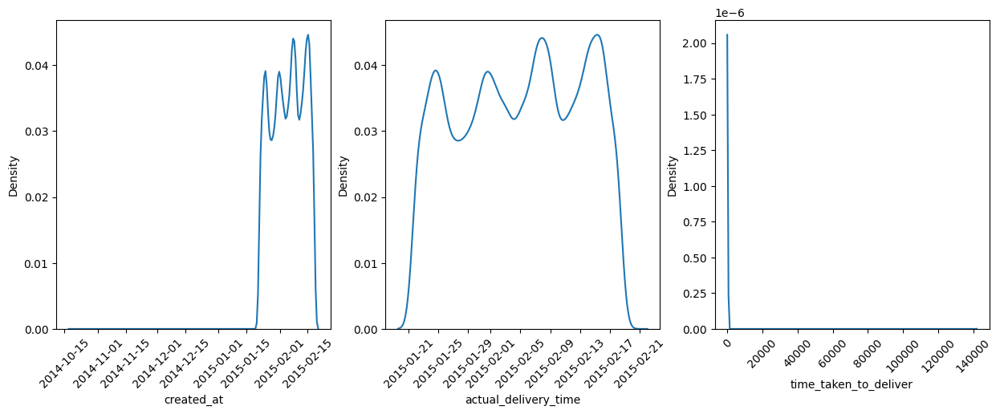

In [29]:
fig = plt.figure(figsize=(15, 5))
k = 1
for i in ["created_at","actual_delivery_time","time_taken_to_deliver"]:
    plt.subplot(1,3,k)
    sns.kdeplot(x = i, data = data)
    plt.xticks(rotation = 45)
    k += 1
warnings.filterwarnings("ignore")
plt.show()

In [30]:
data[data["created_at"]<"2015-01-15"]

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
0,1.0,2014-10-19 05:24:15,2015-01-25 19:11:54,675f9820626f5bc0afb47b57890b466e,italian,1.0,1,1695,1,1595,1595,NaN,NaN,NaN,141947.65,5,6


**Observation:**
> There is only one entry which has large time taken to deliver (`141947.65 min`. It is better to drop that row.

In [31]:
# Filter the rows where 'created_at' is on or after '2015-01-15'
data = data[data['created_at'] >= "2015-01-15"]

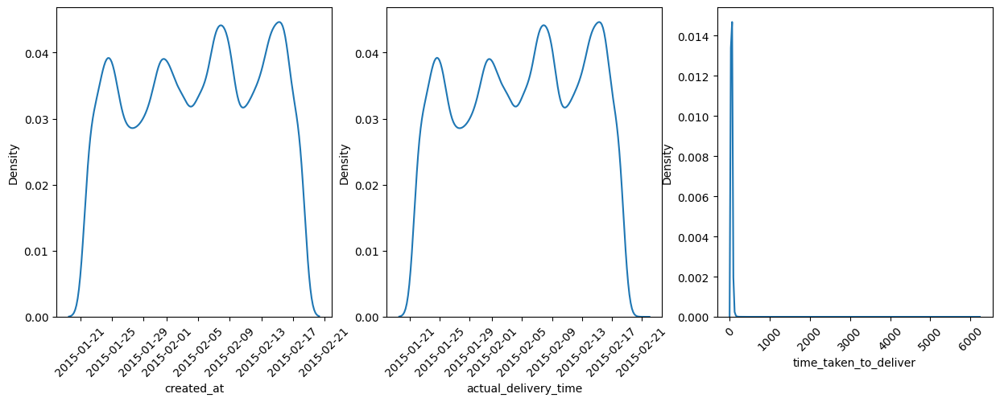

In [32]:
fig = plt.figure(figsize=(15, 5))
k = 1
for i in ["created_at","actual_delivery_time","time_taken_to_deliver"]:
    plt.subplot(1,3,k)
    sns.kdeplot(x = i, data = data)
    plt.xticks(rotation = 45)
    k += 1
warnings.filterwarnings("ignore")
plt.show()

In [33]:
data["time_taken_to_deliver"].describe()

count    197420.000000
mean         47.752181
std          26.888107
min           1.680000
25%          35.070000
50%          44.330000
75%          56.350000
max        6231.320000
Name: time_taken_to_deliver, dtype: float64

In [34]:
for i in [0.9,0.99,0.999,0.9999,0.99999,0.999999,0.9999999]:
    print(i,": ",data["time_taken_to_deliver"].quantile(i))

0.9 :  70.58
0.99 :  107.89619999999995
0.999 :  165.34039000000658
0.9999 :  379.70365199993364
0.99999 :  1069.0195804964565
0.999999 :  6095.110760947433
0.9999999 :  6217.699076112815


**Observations:**
> I am taking `0.999 percentile or 165 mins as extreme case` and dropping all the rows which have time taken greater than 165 mins.

In [35]:
data = data[data['time_taken_to_deliver'] <= data["time_taken_to_deliver"].quantile(0.999)]

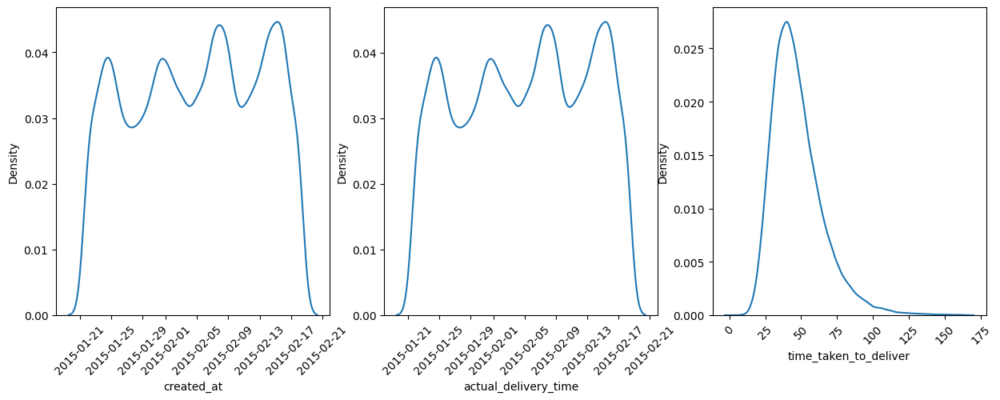

In [37]:
fig = plt.figure(figsize=(15, 5))
k = 1
for i in ["created_at","actual_delivery_time","time_taken_to_deliver"]:
    plt.subplot(1,3,k)
    sns.kdeplot(x = i, data = data)
    plt.xticks(rotation = 45)
    k += 1
warnings.filterwarnings('ignore')
plt.show()

In [38]:
data["time_taken_to_deliver"].describe()

count    197222.00000
mean         47.49503
std          17.91037
min           1.68000
25%          35.07000
50%          44.32000
75%          56.30000
max         165.23000
Name: time_taken_to_deliver, dtype: float64

<Axes: xlabel='time_taken_to_deliver'>

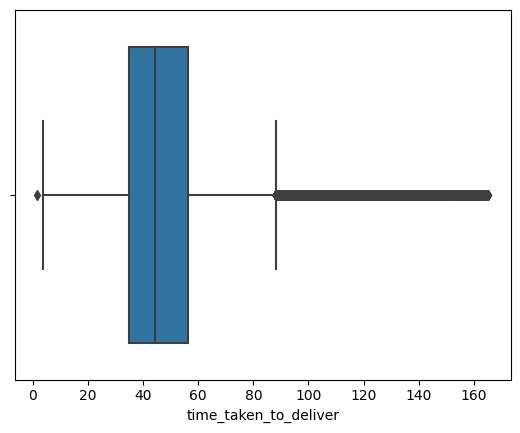

In [41]:
sns.boxplot(data = data, x = "time_taken_to_deliver")

**Observation:**
> If any query point has prediction greater than 165 mins then `manual intervention is required.`

> 197428-197222 = `206 rows` dropped from raw dataset to remove the outliers.

In [42]:
data.isna().sum()

market_id                     985
created_at                      0
actual_delivery_time            0
store_id                        0
store_primary_category       4755
order_protocol                993
total_items                     0
subtotal                        0
num_distinct_items              0
min_item_price                  0
max_item_price                  0
total_onshift_partners      16245
total_busy_partners         16245
total_outstanding_orders    16245
time_taken_to_deliver           0
hour_of_day                     0
day_of_week                     0
dtype: int64

### Exploring the relation between market_id and store_id to impute market_id null values

In [43]:
#checking whether each store orders from unique market
store_market_map_count = data.groupby('store_id')['market_id'].nunique().sort_values(ascending = False)
store_market_map_count

store_id
149e9677a5989fd342ae44213df68868    6
be3e9d3f7d70537357c67bb3f4086846    6
93db85ed909c13838ff95ccfa94cebd9    6
fc8001f834f6a5f0561080d134d53d29    6
edc27f139c3b4e4bb29d1cdbc45663f9    6
                                   ..
ff5eb3449d63c62a5cf39e171bb717a3    1
ff5f900bac84c058978c6b16f895131f    1
ee9aecd92c396ac1108ad72106a74dc2    0
d6d880bcb847d558f357434c6686a565    0
c1d51344306860ede1fca0e6fbae369d    0
Name: market_id, Length: 6742, dtype: int64

**Observation:**
> So all the store_id's are `not mapped to same market_id's`. This implies that stores are `not getting order deliveries from same market`. Can `use mode value of market_id` to `impute null values` in market_id.

> There are `some store id` at bottom of above tables `which have not mapped to even one market_id`.

### Null value imputation of market_id

In [44]:
# Step 1: Create a mapping of store_id to the mode of market_id
store_market_mapping = (
    data.groupby('store_id')['market_id']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Handle cases where mode is empty
    .to_dict()
)

# Step 2: Impute missing values in market_id using the mapping
data['market_id'] = data.apply(
    lambda row: store_market_mapping[row['store_id']] if pd.isna(row['market_id']) else row['market_id'], axis=1
)

In [45]:
data["market_id"].isna().sum()

3

In [46]:
data[data["market_id"].isna()]

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
122637,NaN,2015-02-08 03:39:46,2015-02-08 04:25:31,c1d51344306860ede1fca0e6fbae369d,NaN,NaN,3,3470,3,725,1795,NaN,NaN,NaN,45.75,3,6
127291,NaN,2015-02-08 23:43:19,2015-02-09 00:33:20,ee9aecd92c396ac1108ad72106a74dc2,pizza,NaN,2,3400,2,1000,1400,3.0,3.0,3.0,50.02,23,6
179383,NaN,2015-02-15 23:53:45,2015-02-16 00:25:42,d6d880bcb847d558f357434c6686a565,sandwich,NaN,3,1550,2,250,900,14.0,14.0,18.0,31.95,23,6


In [47]:
# Step 3: If there are still any missing values, fill them with the overall mode of market_id
overall_mode = data['market_id'].mode()[0]  # Get the overall mode of market_id
data['market_id'] = data['market_id'].fillna(overall_mode)

In [48]:
# Step 4: Save the mapping and overall mode to a pickle file
with open('store_market_mapping_with_overall_mode.pkl', 'wb') as f:
    pickle.dump({'store_market_mapping': store_market_mapping, 'overall_mode': overall_mode}, f)

In [ ]:
# Code used during deploying

# # Load the pickle file
# with open('store_market_mapping_with_overall_mode.pkl', 'rb') as f:
#     data_loaded = pickle.load(f)

# # Retrieve the store_market_mapping and overall_mode from the loaded data
# store_market_mapping = data_loaded['store_market_mapping']
# overall_mode = data_loaded['overall_mode']

# data['market_id'] = data.apply(
#    lambda row: store_market_mapping[row['store_id']] if pd.isna(row['market_id']) else row['market_id'], axis=1)

# data['market_id'] = data['market_id'].fillna(overall_mode)


**Observation:**
> `store_market_mapping` helps to impute nan values of market_id based on respective store_id.

> Filling remaining null values by `overall modes` as they are `unknown`. 3 rows remained because these are store_id which have kept only one order without mentioning market_id.

> Saving the `store_market_mapping_with_overall_mode.pkl` pickle file for deploying purpose.

### Exploring the relation between store_id and store_primary_category

In [49]:
store_category_map_count = data.groupby('store_id')['store_primary_category'].nunique().sort_values(ascending=False)
store_category_map_count

store_id
d43ab110ab2489d6b9b2caa394bf920f    25
757b505cfd34c64c85ca5b5690ee5293    22
faacbcd5bf1d018912c116bf2783e9a1    22
45c48cce2e2d7fbdea1afc51c7c6ad26    21
cfecdb276f634854f3ef915e2e980c31    21
                                    ..
ebdc056de8b5669b744b8589add41f8c     0
0ebffb73e257d1190853b416038b6d2c     0
f65d22c53bba4ccf77df86be93a43d5a     0
06d5ae105ea1bea4d800bc96491876e9     0
102b905d54a908ae26000ed4801734b0     0
Name: store_primary_category, Length: 6742, dtype: int64

### Null value imputation of store_primary_category

In [50]:
# Step 1: Create a mapping of store_id to the mode of store_primary_category
store_category_mapping = (
    data.groupby('store_id')['store_primary_category']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Handle cases where mode is empty
    .to_dict()
)

# Step 2: Impute missing values in store_primary_category using the mapping
data['store_primary_category'] = data.apply(
    lambda row: store_category_mapping[row['store_id']] if pd.isna(row['store_primary_category']) else row['store_primary_category'], axis=1
)

In [51]:
data["store_primary_category"].isna().sum()

867

In [52]:
data[data["store_primary_category"].isna()]["store_id"].nunique()

174

In [53]:
# Filter rows where store_primary_category is null and get the store_id
null_store_primary_category = data[data['store_primary_category'].isnull()]['store_id'].unique()

# For each store_id, check if there is at least one non-null store_primary_category
result = {}

for store_id in null_store_primary_category:
    # Get all rows with the same store_id and check if there's at least one non-null store_primary_category
    has_non_null = data[data['store_id'] == store_id]['store_primary_category'].notnull().any()
    result[store_id] = has_non_null

# Print out the store_ids with the result
count = 0
for store_id, has_non_null in result.items():
    if has_non_null == True:
        count+=1
        print(store_id)
print(f"Number of stores with at least one non-null store_primary_category: {count}")

Number of stores with at least one non-null store_primary_category: 0


In [54]:
data[data["store_primary_category"].isna()]["store_id"].value_counts()

store_id
c0e8517b1fe0b5270f3f41d4b56d6118    29
bd3ef5c19067fe179f71c8b86ea4b39b    27
ebdc056de8b5669b744b8589add41f8c    25
1ee3dfcd8a0645a25a35977997223d22    25
0ebffb73e257d1190853b416038b6d2c    25
                                    ..
1294afe6156ef3b577821cd2c97769bf     1
c65d7bd70fe3e5e3a2f3de681edc193d     1
580f9aa264f1108da3db844806f3952e     1
92c3d054835eff3d5a7f7ed731d2a3db     1
040fec70955253769acc94f134177c63     1
Name: count, Length: 174, dtype: int64

In [55]:
data[data["store_id"] == "c0e8517b1fe0b5270f3f41d4b56d6118"]

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
1452,1.0,2015-01-21 21:33:24,2015-01-21 22:06:48,c0e8517b1fe0b5270f3f41d4b56d6118,None,4.0,1,1585,1,1490,1490,23.0,22.0,21.0,33.40,21,2
5799,1.0,2015-01-22 05:01:11,2015-01-22 05:27:53,c0e8517b1fe0b5270f3f41d4b56d6118,None,NaN,3,3785,3,695,1595,21.0,21.0,26.0,26.70,5,3
8342,1.0,2015-01-23 00:44:09,2015-01-23 01:47:00,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,4,2980,3,345,695,17.0,14.0,14.0,62.85,0,4
9340,1.0,2015-01-23 02:00:54,2015-01-23 02:44:50,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,3,2769,3,379,1195,23.0,23.0,21.0,43.93,2,4
33591,1.0,2015-01-26 03:59:00,2015-01-26 04:29:40,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,3,3985,3,795,1795,21.0,12.0,11.0,30.67,3,0
36133,1.0,2015-01-26 23:02:50,2015-01-26 23:43:54,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,7,3627,6,235,1395,12.0,10.0,10.0,41.07,23,0
40229,1.0,2015-01-27 19:05:18,2015-01-27 19:39:34,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,2,2090,2,695,1395,5.0,3.0,3.0,34.27,19,1
56846,1.0,2015-01-30 03:43:24,2015-01-30 04:07:57,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,4,2355,3,235,1395,24.0,27.0,35.0,24.55,3,4
59780,1.0,2015-01-30 21:59:05,2015-01-30 22:57:36,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,2,1340,2,395,895,12.0,13.0,19.0,58.52,21,4
76523,1.0,2015-02-02 00:36:25,2015-02-02 01:38:14,c0e8517b1fe0b5270f3f41d4b56d6118,None,1.0,3,2465,3,375,995,9.0,9.0,17.0,61.82,0,0


In [56]:
# Step 1: Create a mapping of market_id to the mode of store_primary_category
market_category_mapping = (
    data.groupby('market_id')['store_primary_category']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Handle cases where mode is empty
    .to_dict()
)

market_category_mapping

{1.0: 'american',
 2.0: 'mexican',
 3.0: 'american',
 4.0: 'pizza',
 5.0: 'american',
 6.0: 'pizza'}

In [57]:
data["store_primary_category"].value_counts()

store_primary_category
american             19933
pizza                17605
mexican              17325
burger               11325
sandwich             10236
                     ...  
african                 10
belgian                  2
indonesian               2
chocolate                1
alcohol-plus-food        1
Name: count, Length: 74, dtype: int64

In [58]:
# Step 3: Filling the remaining null values as `Unknown` as there are many null values (867)
data['store_primary_category'].fillna('Unknown', inplace=True)

In [59]:
# Step 4: Save the mapping and the default value ('Unknown') into a dictionary
store_category_mapping_with_default = {
    "mapping": store_category_mapping,
    "default_value": "Unknown"
}

# Save to a pickle file
with open('store_category_mapping_with_default.pkl', 'wb') as f:
    pickle.dump(store_category_mapping_with_default, f)

In [ ]:
# Code should be used while deploying

# # Load the pickle file
# with open('store_category_mapping.pkl', 'rb') as f:
#     loaded_mapping = pickle.load(f)

# # Extract the mapping and default value
# store_category_mapping = loaded_mapping["mapping"]
# default_value = loaded_mapping["default_value"]

# # Example usage for a new query point
# data['store_primary_category'] = data.apply(
#     lambda row: store_category_mapping.get(row['store_id'], default_value)
#     if pd.isna(row['store_primary_category']) else row['store_primary_category'], axis=1
# )

**Observation:**
> `store_category_mapping` helps to impute nan values of store_primary_category based on respective store_id.

> `Mode value from market_id cannot be used to impute store_primary_category` because there are only 3 store primary categories for 867 null values which can effect value count distribution.

> So filling remaining null values by `unknown` as there are many (867)null values.

> `store_category_mapping_with_default` pkl file was created for deploying purpose.

### Exploring the relation between store_id and order_protocol

In [60]:
store_order_protocol_map_count = data.groupby('store_id')['order_protocol'].nunique().sort_values(ascending=False)
store_order_protocol_map_count

store_id
05a70454516ecd9194c293b0e415777f    6
c7e1249ffc03eb9ded908c236bd1996d    6
b73dfe25b4b8714c029b37a6ad3006fa    6
0c0a7566915f4f24853fc4192689aa7e    6
0c0cfd9478c6551fbfe74a7acb6fc037    6
                                   ..
fde9264cf376fffe2ee4ddf4a988880d    1
fdff71fcab656abfbefaabecab1a7f6d    1
ee9aecd92c396ac1108ad72106a74dc2    0
d6d880bcb847d558f357434c6686a565    0
c1d51344306860ede1fca0e6fbae369d    0
Name: order_protocol, Length: 6742, dtype: int64

### Null value imputation of order_protocol

In [61]:
# Step 1: Create a mapping of store_id to the mode of order_protocol
store_order_protocol_mapping = (
    data.groupby('store_id')['order_protocol']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Handle cases where mode is empty
    .to_dict()
)

# Step 2: Impute missing values in order_protocol using the mapping
data['order_protocol'] = data.apply(
    lambda row: store_order_protocol_mapping[row['store_id']] if pd.isna(row['order_protocol']) else row['order_protocol'], axis=1
)

In [62]:
data["order_protocol"].isna().sum()

3

In [63]:
data[data["order_protocol"].isna()]

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
122637,2.0,2015-02-08 03:39:46,2015-02-08 04:25:31,c1d51344306860ede1fca0e6fbae369d,Unknown,NaN,3,3470,3,725,1795,NaN,NaN,NaN,45.75,3,6
127291,2.0,2015-02-08 23:43:19,2015-02-09 00:33:20,ee9aecd92c396ac1108ad72106a74dc2,pizza,NaN,2,3400,2,1000,1400,3.0,3.0,3.0,50.02,23,6
179383,2.0,2015-02-15 23:53:45,2015-02-16 00:25:42,d6d880bcb847d558f357434c6686a565,sandwich,NaN,3,1550,2,250,900,14.0,14.0,18.0,31.95,23,6


In [64]:
# Step 3: Create a mapping of market_id to the mode of order_protocol
market_order_protocol_mapping = (
    data.groupby('market_id')['order_protocol']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Handle cases where mode is empty
    .to_dict()
)

In [65]:
market_order_protocol_mapping

{1.0: 1.0, 2.0: 3.0, 3.0: 1.0, 4.0: 3.0, 5.0: 1.0, 6.0: 3.0}

In [66]:
# Step 4: Impute missing values in order_protocol using the mapping
data['order_protocol'] = data.apply(
    lambda row: market_order_protocol_mapping[row['market_id']] if pd.isna(row['order_protocol']) else row['order_protocol'], axis=1
)

In [67]:
# Step 5: Combine both mappings into a dictionary
order_protocol_mappings = {
    "store_order_protocol_mapping": store_order_protocol_mapping,
    "market_order_protocol_mapping": market_order_protocol_mapping,
}

# Step 6: Save the mappings into a pickle file
with open('order_protocol_mappings.pkl', 'wb') as f:
    pickle.dump(order_protocol_mappings, f)


In [ ]:
# # Load the pickle file
# with open('order_protocol_mappings.pkl', 'rb') as f:
#     loaded_mappings = pickle.load(f)

# # Extract the mappings and default value
# store_order_protocol_mapping = loaded_mappings["store_order_protocol_mapping"]
# market_order_protocol_mapping = loaded_mappings["market_order_protocol_mapping"]

# # Impute missing values in `order_protocol`
# data['order_protocol'] = data.apply(
#     lambda row: (
#         store_order_protocol_mapping.get(row['store_id'],
#             market_order_protocol_mapping.get(row['market_id']))  # No fallback, relies solely on mappings
#         if pd.isna(row['order_protocol']) else row['order_protocol']
#     ), axis=1
# )


**Observation:**
> `store_market_mapping` helps to impute nan values of market_id based on respective store_id.

> Filling remaining null values by `overall modes` as they are `unknown`. 3 rows remained because these are store_id which have kept only one order without mentioning market_id.

> Saving the `store_market_mapping_with_overall_mode.pkl` pickle file for deploying purpose.

In [68]:
data.isna().sum()

market_id                       0
created_at                      0
actual_delivery_time            0
store_id                        0
store_primary_category          0
order_protocol                  0
total_items                     0
subtotal                        0
num_distinct_items              0
min_item_price                  0
max_item_price                  0
total_onshift_partners      16245
total_busy_partners         16245
total_outstanding_orders    16245
time_taken_to_deliver           0
hour_of_day                     0
day_of_week                     0
dtype: int64

**Observation:**
> `total_onshift_partners, total_busy_partners, total_outstanding_partners` have around `8.23 % null values`. Remaining all feature null values are imputed.

> Impute missing values for total_onshift_partners, total_busy_partners, and total_outstanding_orders by leveraging group-specific patterns based on `market_id, day_of_week, and hour_of_day`. Within each group, missing values are replaced with the `most frequent (mode) value`, capturing `spatial and temporal trends` in the data. This approach ensures that imputed values are contextually relevant, aligning with regional and time-specific variations. If a `mode is unavailable` (e.g., all values are missing), a `default value (0) `is used as a fallback.

### Null value imputation of `total_onshift_partners, total_busy_partners, total_outstanding_partners`

In [69]:
# Step 1: Create and save mode mappings
last_3_mode_mappings = {}

# Define a function that saves mode mapping for a group
def save_and_fill_with_mode(group, column):
    # Check if the group contains missing values for the given column
    if group[column].isnull().any():
        # Calculate the mode, and ensure we handle the case of empty mode
        mode_value = group[column].mode()
        if not mode_value.empty:
            mode = mode_value[0]  # Get the first mode
        else:
            mode = 0  # Default value if no mode is found
        # Save the mapping for this group
        last_3_mode_mappings[(group['market_id'].iloc[0], group['day_of_week'].iloc[0], group['hour_of_day'].iloc[0], column)] = mode
        # Fill missing values
        group[column] = group[column].fillna(mode)
    return group

# Apply the function for each column and save the mapping
data = data.groupby(['market_id', 'day_of_week', 'hour_of_day'], group_keys=False).apply(
    lambda group: save_and_fill_with_mode(group, 'total_onshift_partners')
)
data = data.groupby(['market_id', 'day_of_week', 'hour_of_day'], group_keys=False).apply(
    lambda group: save_and_fill_with_mode(group, 'total_busy_partners')
)
data = data.groupby(['market_id', 'day_of_week', 'hour_of_day'], group_keys=False).apply(
    lambda group: save_and_fill_with_mode(group, 'total_outstanding_orders')
)

# Step 2: Save the mappings to a pickle file
with open('last_3_mode_mappings.pkl', 'wb') as f:
    pickle.dump(last_3_mode_mappings, f)

# Optional: Verify the saved mappings
print("Mode mappings saved to 'last_3_mode_mappings.pkl'")


Mode mappings saved to 'last_3_mode_mappings.pkl'


In [70]:
data.isna().sum()

market_id                   0
created_at                  0
actual_delivery_time        0
store_id                    0
store_primary_category      0
order_protocol              0
total_items                 0
subtotal                    0
num_distinct_items          0
min_item_price              0
max_item_price              0
total_onshift_partners      0
total_busy_partners         0
total_outstanding_orders    0
time_taken_to_deliver       0
hour_of_day                 0
day_of_week                 0
dtype: int64

In [ ]:
# # code used during deployment

# # Step 1: Load the mode mappings from the pickle file
# with open('mode_mappings.pkl', 'rb') as f:
#     mode_mappings = pickle.load(f)

# # Define a function to impute using the mode mappings with a default fallback
# def impute_with_mode(row, column):
#     key = (row['market_id'], row['day_of_week'], row['hour_of_day'], column)

#     # Get the mode from the mapping, or fallback to a default value (e.g., 0) if not found
#     mode_value = mode_mappings.get(key, 0)  # Default to 0 if the combination is not found

#     # Impute missing values with the mode_value
#     if pd.isna(row[column]):
#         return mode_value
#     else:
#         return row[column]

# # Apply the imputation function to the relevant columns
# data['total_onshift_partners'] = data.apply(impute_with_mode, axis=1, column='total_onshift_partners')
# data['total_busy_partners'] = data.apply(impute_with_mode, axis=1, column='total_busy_partners')
# data['total_outstanding_orders'] = data.apply(impute_with_mode, axis=1, column='total_outstanding_orders')


**Observation:**
> Null values in `total_onshift_partners, total_busy_partners, total_outstanding_partners` can be imputed using `last_3_mode_mappings.pkl`

> If the combination of market_id, hour_of_day, day_of_week not present in mapping, then above deployment code make sure that the `default value = 0`

### Handling negative values `total_onshift_partners, total_busy_partners, total_outstanding_partners, min_item_price`

In [71]:
data.describe()

,market_id,created_at,actual_delivery_time,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
count,197222.000000,197222,197222,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.00000,197222.000000,197222.000000
mean,2.978562,2015-02-04 22:00:49.659185664,2015-02-04 22:48:19.361435392,2.882437,3.196408,2682.173170,2.670828,686.117340,1159.487730,43.218343,39.816126,55.416404,47.49503,8.466789,3.219408
min,1.000000,2015-01-21 15:22:03,2015-01-21 15:58:11,1.000000,1.000000,0.000000,1.000000,-86.000000,0.000000,-4.000000,-5.000000,-6.000000,1.68000,0.000000,0.000000
25%,2.000000,2015-01-29 02:32:18.249999872,2015-01-29 03:21:54.500000,1.000000,2.000000,1400.000000,1.000000,299.000000,800.000000,15.000000,14.000000,15.000000,35.07000,2.000000,1.000000
50%,3.000000,2015-02-05 03:30:34.500000,2015-02-05 04:41:30,3.000000,3.000000,2200.000000,2.000000,595.000000,1095.000000,34.000000,32.000000,37.000000,44.32000,3.000000,3.000000
75%,4.000000,2015-02-12 01:38:54.500000,2015-02-12 02:24:56.249999872,4.000000,4.000000,3395.000000,3.000000,949.000000,1395.000000,63.000000,60.000000,81.000000,56.30000,19.000000,5.000000
max,6.000000,2015-02-18 06:00:44,2015-02-18 07:35:20,7.000000,411.000000,27100.000000,20.000000,14700.000000,14700.000000,171.000000,154.000000,285.000000,165.23000,23.000000,6.000000
std,1.524507,NaN,NaN,1.503830,2.666784,1822.907035,1.630301,521.619984,558.033622,34.626936,31.979307,52.184493,17.91037,8.658583,2.045660


**Observation:**
> Negative values in these features are due to wrong sign entry

In [72]:
data['total_onshift_partners'] = data['total_onshift_partners'].abs()
data['total_busy_partners'] = data['total_busy_partners'].abs()
data['total_outstanding_orders'] = data['total_outstanding_orders'].abs()
data['min_item_price'] = data['min_item_price'].abs()

In [73]:
data.describe()

,market_id,created_at,actual_delivery_time,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
count,197222.000000,197222,197222,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.000000,197222.00000,197222.000000,197222.000000
mean,2.978562,2015-02-04 22:00:49.659185664,2015-02-04 22:48:19.361435392,2.882437,3.196408,2682.173170,2.670828,686.121214,1159.487730,43.218738,39.816511,55.417661,47.49503,8.466789,3.219408
min,1.000000,2015-01-21 15:22:03,2015-01-21 15:58:11,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.68000,0.000000,0.000000
25%,2.000000,2015-01-29 02:32:18.249999872,2015-01-29 03:21:54.500000,1.000000,2.000000,1400.000000,1.000000,299.000000,800.000000,15.000000,14.000000,15.000000,35.07000,2.000000,1.000000
50%,3.000000,2015-02-05 03:30:34.500000,2015-02-05 04:41:30,3.000000,3.000000,2200.000000,2.000000,595.000000,1095.000000,34.000000,32.000000,37.000000,44.32000,3.000000,3.000000
75%,4.000000,2015-02-12 01:38:54.500000,2015-02-12 02:24:56.249999872,4.000000,4.000000,3395.000000,3.000000,949.000000,1395.000000,63.000000,60.000000,81.000000,56.30000,19.000000,5.000000
max,6.000000,2015-02-18 06:00:44,2015-02-18 07:35:20,7.000000,411.000000,27100.000000,20.000000,14700.000000,14700.000000,171.000000,154.000000,285.000000,165.23000,23.000000,6.000000
std,1.524507,NaN,NaN,1.503830,2.666784,1822.907035,1.630301,521.614888,558.033622,34.626442,31.978827,52.183157,17.91037,8.658583,2.045660


## DROPPING DUPLICATES

### Checking for Duplicated Rows

In [74]:
data.duplicated().sum()

0

### Checking for Duplicated Rows after grouping by `["market_id","created_at","actual_delivery_time","store_id","store_primary_category","order_protocol"]`

In [75]:
data_duplicates = data.groupby(['market_id', 'created_at', 'actual_delivery_time', 'store_id','store_primary_category', 'order_protocol']).filter(lambda x: len(x) > 1)

In [76]:
data_duplicates.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
7731,4.0,2015-01-22 22:25:07,2015-01-22 22:52:20,9a96a2c73c0d477ff2a6da3bf538f4f4,burger,4.0,1,749,1,749,749,24.0,19.0,19.0,27.22,22,3
7732,4.0,2015-01-22 22:25:07,2015-01-22 22:52:20,9a96a2c73c0d477ff2a6da3bf538f4f4,burger,4.0,1,749,1,749,749,23.0,37.0,16.0,27.22,22,3
7735,2.0,2015-01-22 22:25:21,2015-01-22 23:13:47,a529ea43c249fcbee9685c74d8baa9eb,sandwich,3.0,6,2476,4,129,565,23.0,25.0,28.0,48.43,22,3
7736,2.0,2015-01-22 22:25:21,2015-01-22 23:13:47,a529ea43c249fcbee9685c74d8baa9eb,sandwich,3.0,6,2476,4,129,565,24.0,32.0,29.0,48.43,22,3
8625,2.0,2015-01-23 01:15:02,2015-01-23 01:57:24,8e6b42f1644ecb1327dc03ab345e618b,greek,1.0,1,1499,1,1499,1499,50.0,50.0,62.0,42.37,1,4


In [77]:
data_duplicates.shape

(280, 17)

### Removing the duplicates

In [78]:
# Group by the subset of columns to identify duplicates
data =   data.drop_duplicates(subset = ["market_id", "created_at", "actual_delivery_time",
         "store_id", "store_primary_category", "order_protocol"],keep = "first")

In [79]:
data.shape

(197073, 17)

In [80]:
data_duplicates = data.groupby(['market_id', 'created_at', 'actual_delivery_time', 'store_id','store_primary_category', 'order_protocol']).filter(lambda x: len(x) > 1)

In [81]:
data_duplicates.shape

(0, 17)

**Observations:**
> To get primary key of data, we need to combine ["market_id","created_at","actual_delivery_time","store_id","store_primary_category","order_protocol"].

> So we are dropping the duplicates by using above `keep = "first"`.

## INSIGHTS

### Handling Null Values

> Sorted the data with respect to `created_at` time_stamp which indicates orders are in chronological order.

> Null values are `actual_delivery_time` are dropped as they are low in number and this feature is important to create target feature.

>  Null values in `market_id`, `store_primary_category`, `order_protcol` is imputed using `grouped store_id mode values`. 

> There are very few number of rows remained with null values in `market_id` & `order_protocol`.For them, `overall mode values` was used.Remained values in `store_primary_category` are named as `unknown` category as there are many.

> Null values in `total_onshift_partners, total_busy_partners, total_outstanding_orders` are imputed using grouped by `market_id, hour_of_day, day_of_week` mode values. Assumption is these feature have hourly or daily seasonality.

### Feature Engineering

> Time related features like `time_taken_to_deliver`, `hour_of_day` and `day_of_week` are extracted.

> `time_taken_to_deliver` is Target feature in this Delivery Time prediction Project.

### Removing Univariate Outliers

> Outliers with high skewness in kde plot are identified in `created_at` column. Cropped the outlier data by using `2015-01-15` date. Orders before this date is treated as outliers. 

> `time_to_taken_to_deliver` outliers are handled using quantiles. Values greater than `0.999 percentile` are treated as outliers

### Handling Duplicates

> Duplicate rows are found at primary key level. Those are dropped by keeping the first row.

### Handling Negative Values

> Meaning less negative values in `min_item_price, total_onshift_partners, total_busy_partners, total_outstanding_orders` are converted to positive values by treating them as wrong entries.

# CHAPTER 3: DATA VISUALIZATION

## UNIVARIATE ANALYSIS

In [82]:
cont_cols = ["time_taken_to_deliver","total_items","subtotal","num_distinct_items","min_item_price","max_item_price","total_onshift_partners","total_busy_partners","total_outstanding_orders"]
cat_cols = ['market_id','store_primary_category', 'order_protocol','hour_of_day','day_of_week']
time_cols = ['created_at', 'actual_delivery_time']

### Distribution plots of all Numerical Columns

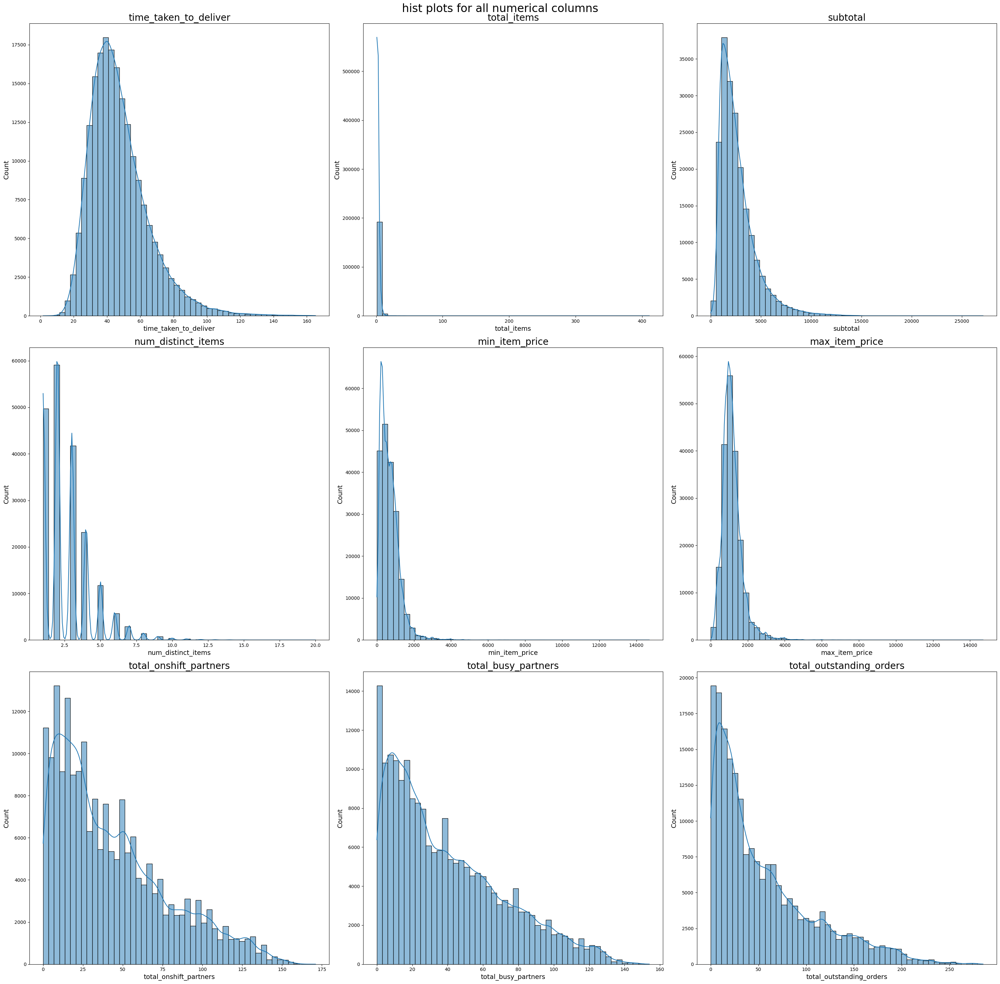

In [83]:
fig = plt.figure(figsize = (3*10,len(cont_cols)*10/3))
plt.suptitle("hist plots for all numerical columns\n",fontsize=24)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/3),3,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.histplot(data=data,x = i,kde = True,bins = 50)

    # Increase label and legend font sizes
    plot.set_xlabel(plot.get_xlabel(), fontsize=14)
    plot.set_ylabel(plot.get_ylabel(), fontsize=14)

    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

<Axes: xlabel='total_items', ylabel='Count'>

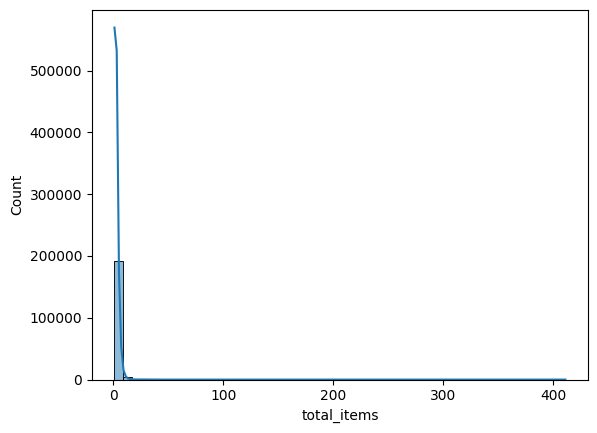

In [84]:
# total items has high skewnes because of outliers
sns.histplot(data=data,x = "total_items",kde = True,bins = 50)

In [85]:
for i in [0.9,0.99,0.999,0.9999, 0.99999,0.999999]:
    print(i,":" ,data["total_items"].quantile(i))

0.9 : 6.0
0.99 : 12.0
0.999 : 25.0
0.9999 : 42.29279999996652
0.99999 : 66.52704000030644
0.999999 : 346.5574559967499


In [86]:
len(data[data["total_items"] >= 66])

3

In [87]:
data = data[data['total_items'] <= data["total_items"].quantile(0.99999)]

<Axes: xlabel='total_items', ylabel='Count'>

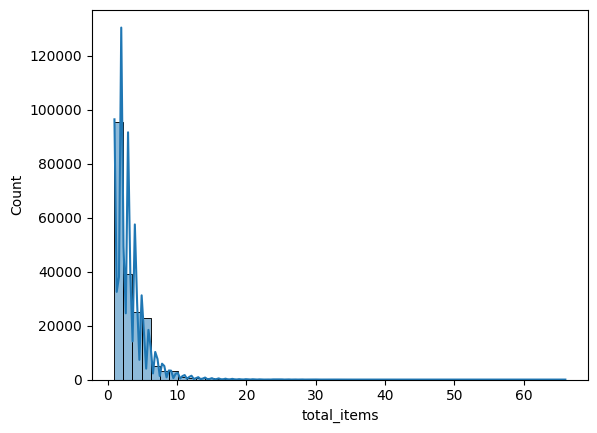

In [88]:
sns.histplot(data=data,x = "total_items",kde = True,bins = 50)

### Box plots of all Numerical columns

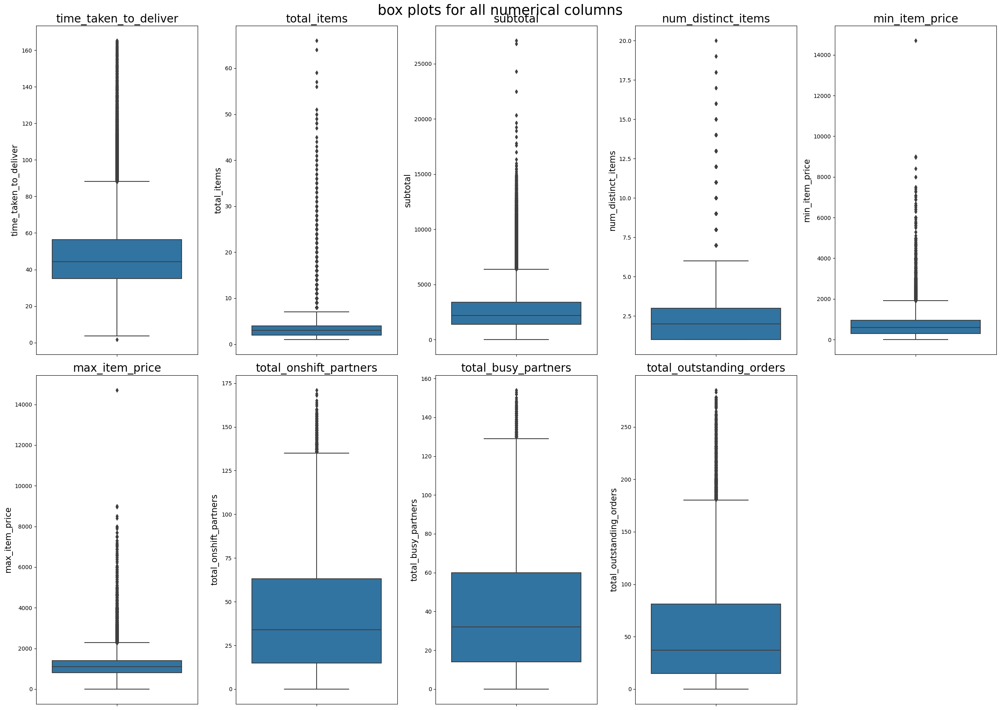

In [89]:
fig = plt.figure(figsize = (5*5,len(cont_cols)*5/(5/2)))
plt.suptitle("box plots for all numerical columns\n",fontsize=25)
k = 1
for i in cont_cols:
    plt.subplot(math.ceil(len(cont_cols)/5),5,k)
    plt.title("{}".format(i),fontsize = 20)
    k += 1
    plot = sns.boxplot(data=data,y = i)

    # Increase label and legend font sizes
    plot.set_xlabel(plot.get_xlabel(), fontsize=15)
    plot.set_ylabel(plot.get_ylabel(), fontsize=15)

    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
warnings.filterwarnings('ignore')

### Count plots of all categorical columns

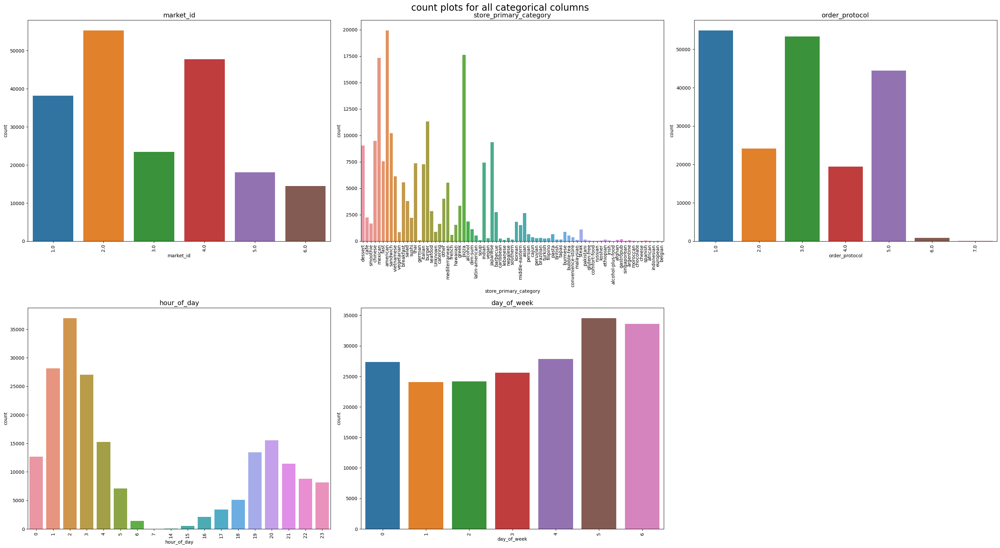

In [90]:
fig = plt.figure(figsize = (3*10,len(cat_cols)*10/3))
plt.suptitle("count plots for all categorical columns\n",fontsize=20)
k = 1
for i in cat_cols:
    plt.subplot(math.ceil(len(cat_cols)/3),3,k)
    plt.title("{}".format(i),fontsize = 14)
    k += 1
    sns.countplot(data=data,x = i)
    plt.xticks(rotation = 90)

    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
warnings.filterwarnings('ignore')

## BIVARIATE ANALYSIS OF IMPORTANT FEATURES

In [91]:
cat_comb = [("store_primary_category","market_id"),("order_protocol","market_id"),("hour_of_day","market_id"),("day_of_week","market_id"),("store_primary_category","order_protocol"),("store_primary_category","hour_of_day"),("order_protocol","hour_of_day"),("store_primary_category","day_of_week"),("order_protocol","day_of_week")]

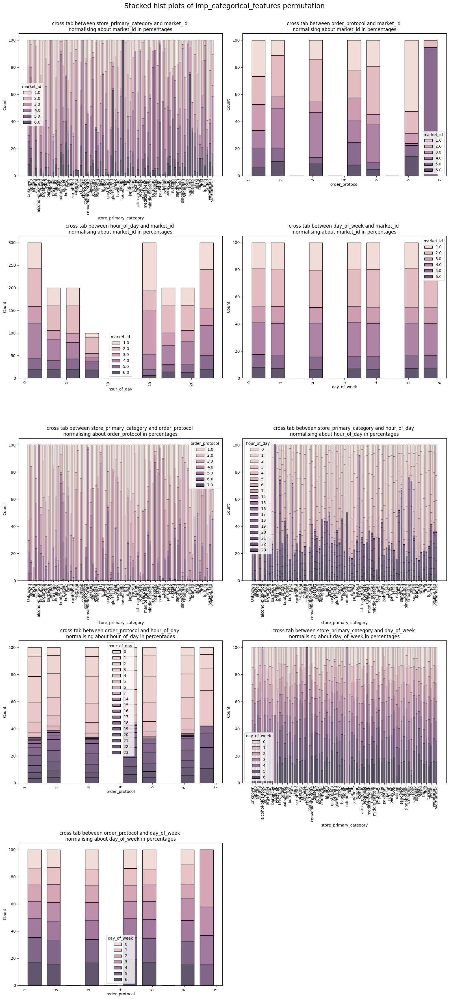

In [92]:
fig = plt.figure(figsize = (2*8,len(cat_comb)*8/2))
plt.suptitle("Stacked hist plots of imp_categorical_features permutation\n",fontsize="xx-large")
k = 1
for p,q in cat_comb:
    plt.subplot(math.ceil(len(cat_comb)/2),2,k)
    plt.title(f"cross tab between {p} and {q} \nnormalising about {q} in percentages")
    k += 1
    plot = data.groupby([p])[q].value_counts(normalize=True).mul(100).reset_index(name='percentage')
    sns.histplot(x = p , hue = q, weights= 'percentage', multiple = 'stack',data=plot,shrink = 0.7)
    plt.xticks(rotation = 90)
    warnings.filterwarnings('ignore')
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()
warnings.filterwarnings('ignore')

### Numerical Vs Categorical

In [94]:
imp_cat_features = ['market_id','order_protocol', 'hour_of_day', 'day_of_week']
imp_cont_features = ["time_taken_to_deliver",'total_items','subtotal',"max_item_price",'total_onshift_partners','total_busy_partners','total_outstanding_orders']
Cat_Vs_cont = []
for i in range(len(imp_cat_features)):
    for j in range(len(imp_cont_features)):
        Cat_Vs_cont.append((imp_cat_features[i], imp_cont_features[j]))
print(Cat_Vs_cont)
print(len(Cat_Vs_cont))

[('market_id', 'time_taken_to_deliver'), ('market_id', 'total_items'), ('market_id', 'subtotal'), ('market_id', 'max_item_price'), ('market_id', 'total_onshift_partners'), ('market_id', 'total_busy_partners'), ('market_id', 'total_outstanding_orders'), ('order_protocol', 'time_taken_to_deliver'), ('order_protocol', 'total_items'), ('order_protocol', 'subtotal'), ('order_protocol', 'max_item_price'), ('order_protocol', 'total_onshift_partners'), ('order_protocol', 'total_busy_partners'), ('order_protocol', 'total_outstanding_orders'), ('hour_of_day', 'time_taken_to_deliver'), ('hour_of_day', 'total_items'), ('hour_of_day', 'subtotal'), ('hour_of_day', 'max_item_price'), ('hour_of_day', 'total_onshift_partners'), ('hour_of_day', 'total_busy_partners'), ('hour_of_day', 'total_outstanding_orders'), ('day_of_week', 'time_taken_to_deliver'), ('day_of_week', 'total_items'), ('day_of_week', 'subtotal'), ('day_of_week', 'max_item_price'), ('day_of_week', 'total_onshift_partners'), ('day_of_week

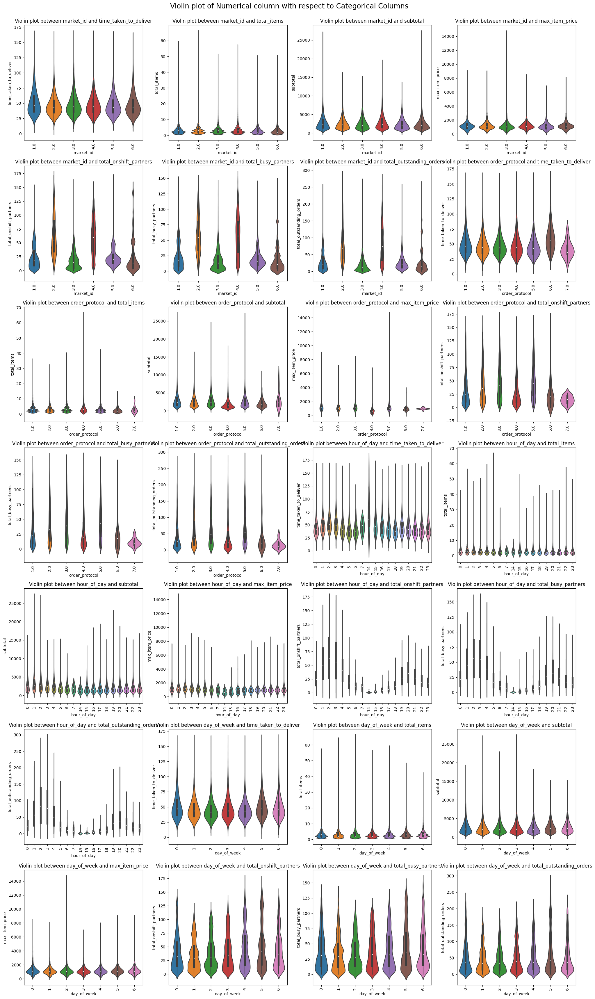

In [95]:
# Suppress warnings
warnings.filterwarnings('ignore')

# Number of rows and columns in the grid
num_cols = 4
num_plots = len(Cat_Vs_cont)
num_rows = math.ceil(num_plots / num_cols)

# Create a figure
fig = plt.figure(figsize=(num_cols * 5, num_rows * 5))
plt.suptitle("Violin plot of Numerical column with respect to Categorical Columns", fontsize="xx-large")

# Create subplots
for k, (p, q) in enumerate(Cat_Vs_cont, start=1):
    plt.subplot(num_rows, num_cols, k)
    plt.title(f"Violin plot between {p} and {q}")
    sns.violinplot(data=data, x=p, y=q)
    plt.xticks(rotation=90)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.98])  # Avoid overlap with suptitle
plt.show()

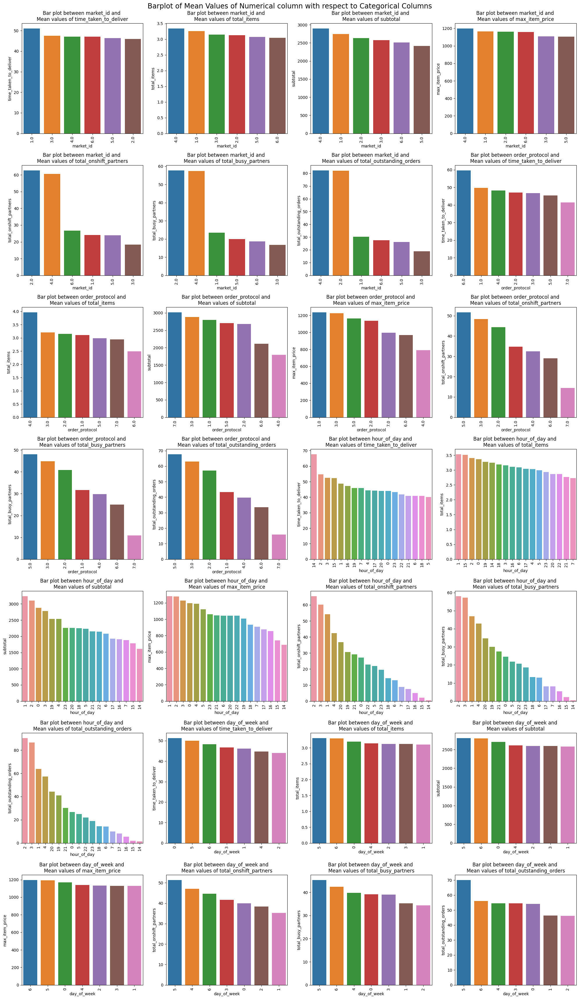

In [96]:
fig = plt.figure(figsize = (4*5,len(Cat_Vs_cont)*5/4))
plt.suptitle("Barplot of Mean Values of Numerical column with respect to Categorical Columns\n",fontsize = "xx-large")
k = 1
for p,q in Cat_Vs_cont:
    plt.subplot(math.ceil(len(Cat_Vs_cont)/4),4,k)
    plt.title(f"Bar plot between {p} and \nMean values of {q}")
    k += 1
    df = pd.DataFrame(data.groupby([p])[[q]].mean().reset_index())
    sns.barplot(data = df,x = p,y= q,order = df.sort_values(q,ascending = False)[p])
    plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()
warnings.filterwarnings('ignore')

## MULTI-VARIATE ANALYSIS OF IMPORTANT FEATURES

In [97]:
cont_comb = [("time_taken_to_deliver","total_items"),("time_taken_to_deliver","subtotal"),("time_taken_to_deliver","max_item_price"),("time_taken_to_deliver","total_onshift_partners"),("time_taken_to_deliver","total_busy_partners"),("time_taken_to_deliver","total_outstanding_orders")]

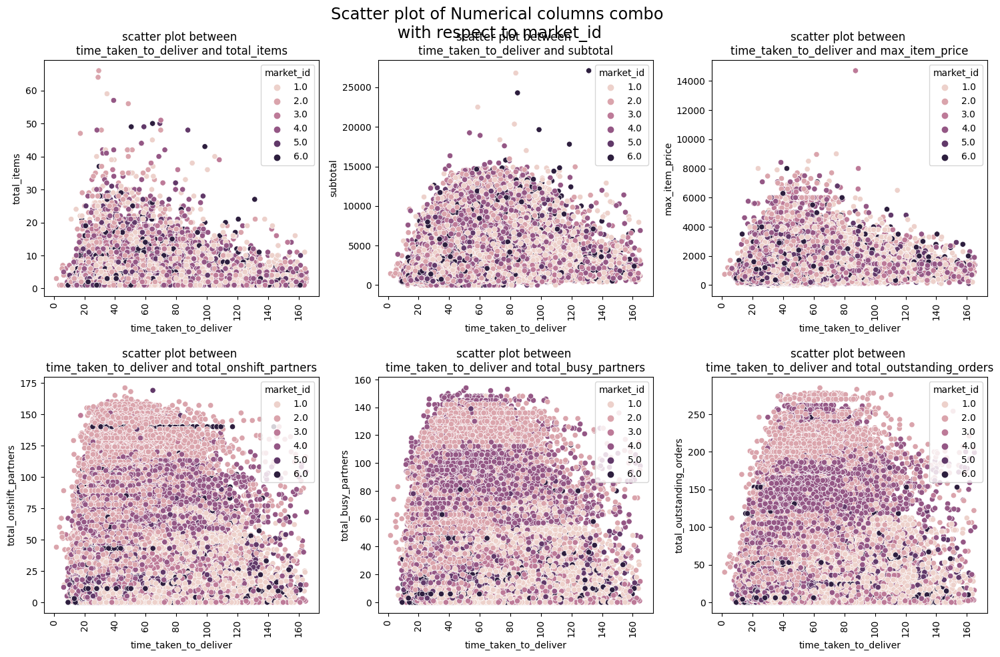

In [98]:
fig = plt.figure(figsize = (3*5,len(cont_comb)*5/3))
plt.suptitle("Scatter plot of Numerical columns combo\n with respect to market_id\n",fontsize = "xx-large")
k = 1
for p,q in cont_comb:
    plt.subplot(math.ceil(len(cont_comb)/3),3,k)
    plt.title(f"scatter plot between \n{p} and {q}")
    k += 1
    sns.scatterplot(data = data,x=p,y=q,hue = "market_id")
    plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()
warnings.filterwarnings('ignore')

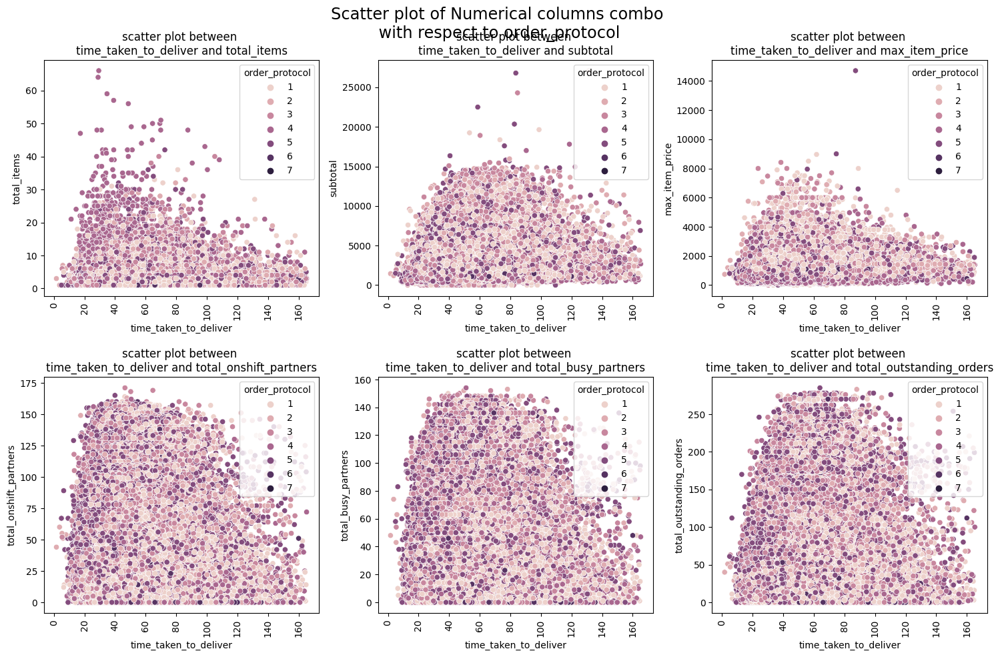

In [99]:
fig = plt.figure(figsize = (3*5,len(cont_comb)*5/3))
plt.suptitle("Scatter plot of Numerical columns combo\n with respect to order_protocol\n",fontsize = "xx-large")
k = 1
for p,q in cont_comb:
    plt.subplot(math.ceil(len(cont_comb)/3),3,k)
    plt.title(f"scatter plot between \n{p} and {q}")
    k += 1
    sns.scatterplot(data = data,x=p,y=q,hue = "order_protocol")
    plt.xticks(rotation = 90)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()
warnings.filterwarnings('ignore')

## HEAT MAPS

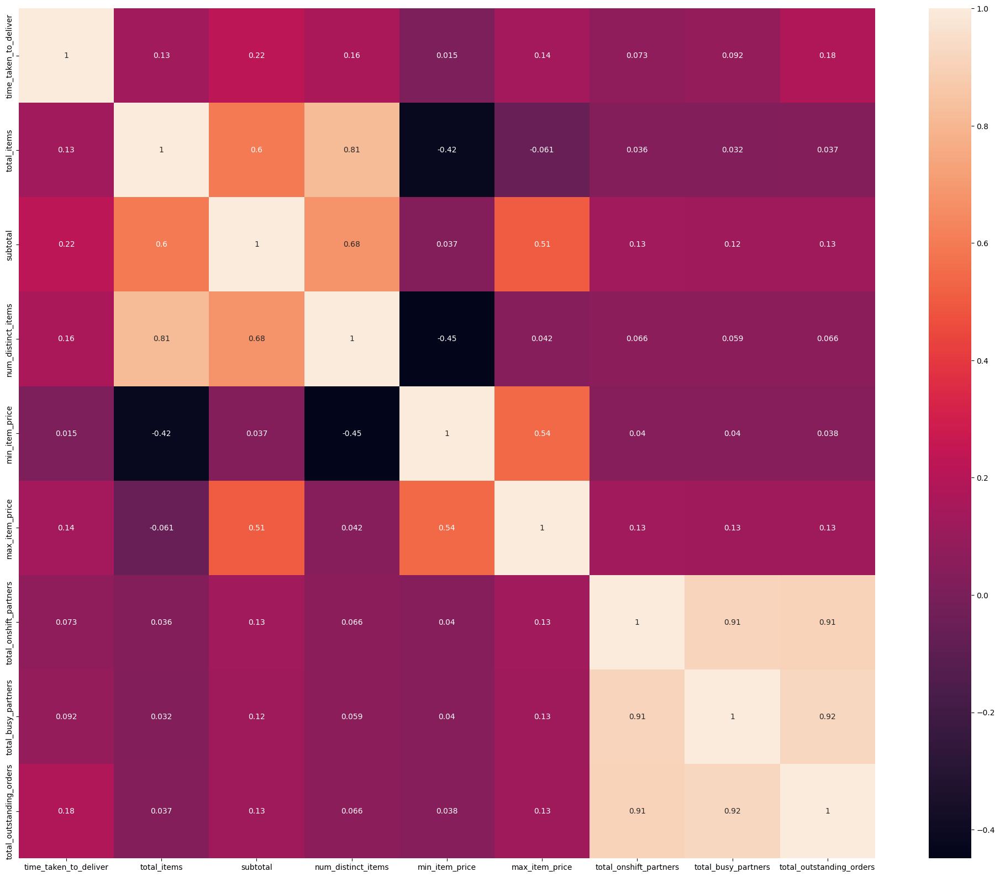

In [100]:
corr = data[cont_cols].corr(numeric_only= True)
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True)
plt.show()

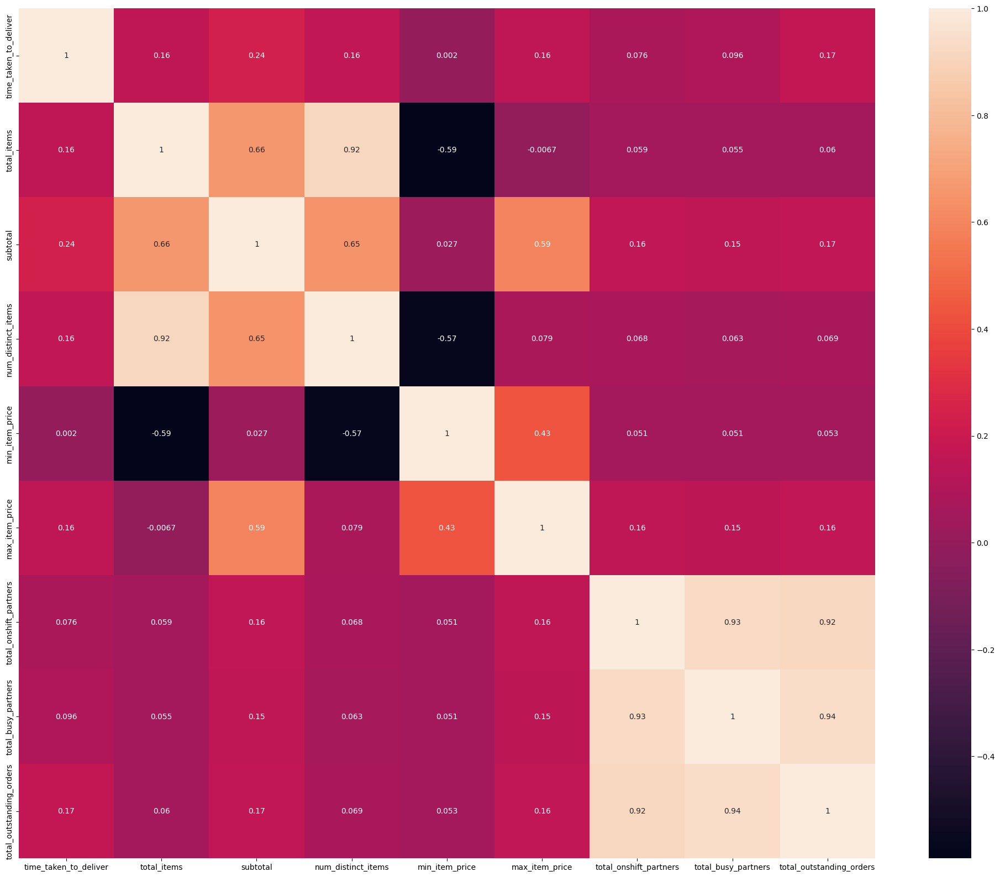

In [101]:
corr = data[cont_cols].corr(numeric_only = True,method= 'spearman')
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True)
plt.show()

## PAIR PLOT

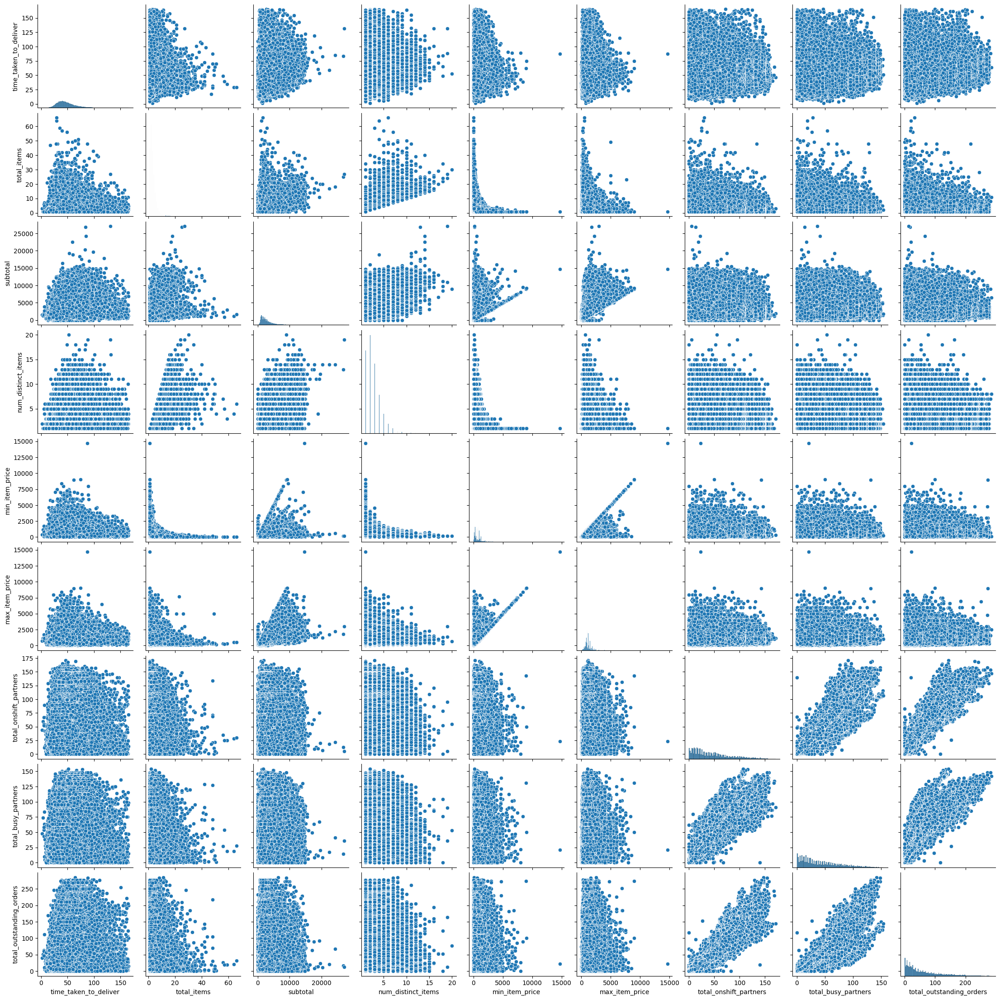

In [102]:
sns.pairplot(data[cont_cols])

In [103]:
data.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
1,1.0,2015-01-21 15:22:03,2015-01-21 16:17:43,6a639c52538fd7bb3e1186724afbe9b2,dessert,4.0,2,1058,2,219,799,2.0,1.0,1.0,55.67,15,2
2,3.0,2015-01-21 15:31:51,2015-01-21 16:16:34,12fb63ba1566cb03484e1e5e290a73f4,cafe,4.0,2,690,2,195,255,2.0,0.0,1.0,44.72,15,2
3,1.0,2015-01-21 15:39:16,2015-01-21 15:58:11,f7cfdde9db36af8e0d9a6d123d5c385e,smoothie,4.0,3,1867,3,449,529,4.0,1.0,1.0,18.92,15,2
4,1.0,2015-01-21 15:40:42,2015-01-21 16:22:37,83f97f4825290be4cb794ec6a234595f,cafe,4.0,3,955,3,245,345,3.0,2.0,2.0,41.92,15,2
5,1.0,2015-01-21 15:41:33,2015-01-21 16:35:14,4195cac6ce8d484d041594a3faa2e13d,chinese,3.0,3,825,1,125,125,0.0,0.0,0.0,53.68,15,2


In [104]:
data.shape

(197071, 17)

In [105]:
data.to_csv("data_modified.csv",index = False)

## INSIGHTS

## Summary of Insights and Observations

### Scatter Plots Insights
1. **Time Taken to Deliver vs. Total Items**  
   - Positive correlation: Higher total items lead to increased delivery time.  
   - Efficiency varies across markets, with some handling larger orders better.  

2. **Time Taken to Deliver vs. Subtotal**  
   - Positive correlation: Higher subtotals result in longer delivery times.  
   - Market-specific variations in managing high-value orders.  

3. **Time Taken to Deliver vs. Max Item Price**  
   - Weak correlation: Max item price has minimal impact on delivery times.  
   - Delivery times remain consistent across price ranges.  

4. **Time Taken to Deliver vs. Total Onshift Partners**  
   - Negative correlation: More onshift partners reduce delivery times.  
   - Highlights the importance of adequate staffing.  

5. **Time Taken to Deliver vs. Total Busy Partners**  
   - Positive correlation: Higher busy partner counts lead to delays.  
   - Suggests potential inefficiencies during peak workloads.  

6. **Time Taken to Deliver vs. Total Outstanding Orders**  
   - Positive correlation: More outstanding orders increase delivery times.  
   - Emphasizes the need for effective order management.

---

### Key Correlations
1. **High Correlations**  
   - Total items vs. distinct items (0.81): Larger orders tend to include more variety.  
   - Onshift partners, busy partners, and outstanding orders (0.91-0.92): Strong interdependence indicates workload affects staffing needs.

2. **Moderate Correlations**  
   - Subtotal vs. distinct items (0.68): High subtotals often involve more diverse items.  
   - Max vs. min item prices (0.54): Higher max prices align with higher min prices.

3. **Low/Negative Correlations**  
   - Min item price vs. total items (-0.42): Higher min prices correspond to fewer items.  
   - Delivery time has low correlations with most features.

---

### Distribution Insights
- Most distributions are skewed, with dense clustering at lower values (e.g., subtotals, items, delivery times).  
- Geographical and temporal data (coordinates, order time) show clustering, highlighting specific patterns or regional trends.  
- Outliers are present but not addressed, as neural networks can handle them effectively.

# Load the modified data and files

In [ ]:
# load the files
data = pd.read_csv("data_modified.csv")

In [106]:
data.head()

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,time_taken_to_deliver,hour_of_day,day_of_week
1,1.0,2015-01-21 15:22:03,2015-01-21 16:17:43,6a639c52538fd7bb3e1186724afbe9b2,dessert,4.0,2,1058,2,219,799,2.0,1.0,1.0,55.67,15,2
2,3.0,2015-01-21 15:31:51,2015-01-21 16:16:34,12fb63ba1566cb03484e1e5e290a73f4,cafe,4.0,2,690,2,195,255,2.0,0.0,1.0,44.72,15,2
3,1.0,2015-01-21 15:39:16,2015-01-21 15:58:11,f7cfdde9db36af8e0d9a6d123d5c385e,smoothie,4.0,3,1867,3,449,529,4.0,1.0,1.0,18.92,15,2
4,1.0,2015-01-21 15:40:42,2015-01-21 16:22:37,83f97f4825290be4cb794ec6a234595f,cafe,4.0,3,955,3,245,345,3.0,2.0,2.0,41.92,15,2
5,1.0,2015-01-21 15:41:33,2015-01-21 16:35:14,4195cac6ce8d484d041594a3faa2e13d,chinese,3.0,3,825,1,125,125,0.0,0.0,0.0,53.68,15,2


In [107]:
data.shape

(197071, 17)

# CHAPTER 4: DATA PREPROCESSING FOR DL MODELING

## TRAIN TEST SPLIT

In [149]:
# We do not need the ID column and the date columns as we have extracted teh features that we wanted
X = data.drop(['store_id','created_at','actual_delivery_time','time_taken_to_deliver'], axis = 1)
y = data['time_taken_to_deliver']

In [150]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42)

print('Train : ', X_train.shape, y_train.shape)
print('Validation:', X_val.shape, y_val.shape)
print('Test  : ', X_test.shape, y_test.shape)

Train :  (126124, 13) (126124,)
Validation: (31532, 13) (31532,)
Test  :  (39415, 13) (39415,)


## MEAN TARGET ENCODING THE `store_primary_category`

In [151]:
# Compute the target encoding for the training set
train_data = X_train.copy()  # Make a copy to avoid modifying X_train directly
train_data['time_taken_to_deliver'] = y_train  # Add the target column to the features temporarily

# Compute target means
target_means = train_data.groupby('store_primary_category')['time_taken_to_deliver'].mean()

# Compute the mean of the target variable (to handle unseen categories later)
mean_target_value = y_train.mean()

# Save both the target encoding and the mean target value to a pickle file
encoding_data = {'target_means': target_means, 'mean_target_value': mean_target_value}


In [152]:
# Map the target means to the training, validation, and test sets
X_train['store_primary_category_encoded'] = X_train['store_primary_category'].map(target_means)
X_val['store_primary_category_encoded'] = X_val['store_primary_category'].map(target_means)
X_test['store_primary_category_encoded'] = X_test['store_primary_category'].map(target_means)

# Fill NaN values (for unseen categories in val/test) with the mean of the target variable
X_train['store_primary_category_encoded'] = X_train['store_primary_category_encoded'].fillna(mean_target_value)
X_val['store_primary_category_encoded'] = X_val['store_primary_category_encoded'].fillna(mean_target_value)
X_test['store_primary_category_encoded'] = X_test['store_primary_category_encoded'].fillna(mean_target_value)

# Drop the original categorical column if needed
X_train = X_train.drop(columns=['store_primary_category'])
X_val = X_val.drop(columns=['store_primary_category'])
X_test = X_test.drop(columns=['store_primary_category'])

In [153]:
with open('target_encoding_and_mean.pkl', 'wb') as f:
    pickle.dump(encoding_data, f)

In [ ]:
# for deployment purpose
# with open('target_encoding_and_mean.pkl', 'rb') as f:
#     encoding_data = pickle.load(f)

# # Now you can access encoding_data, which contains both the target encoding and mean target value
# target_means = encoding_data['target_means']
# mean_target_value = encoding_data['mean_target_value']

## OUTLIER REMOVAL USING LOCAL OUTLIER FACTOR

In [154]:
lof = LocalOutlierFactor()
X_train['lof_anomaly_score'] = lof.fit_predict(X_train)

In [155]:
print("number_of_outliers: ",(len(X_train.loc[(X_train['lof_anomaly_score'] == -1)])))

number_of_outliers:  2611


In [156]:
mask = X_train['lof_anomaly_score'] == 1
X_train = X_train.loc[mask]
y_train = y_train.loc[mask]

In [157]:
X_train.drop(['lof_anomaly_score'],axis = 1, inplace = True)
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 123513 entries, 38924 to 48107
Data columns (total 13 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   market_id                       123513 non-null  float64
 1   order_protocol                  123513 non-null  float64
 2   total_items                     123513 non-null  int64  
 3   subtotal                        123513 non-null  int64  
 4   num_distinct_items              123513 non-null  int64  
 5   min_item_price                  123513 non-null  int64  
 6   max_item_price                  123513 non-null  int64  
 7   total_onshift_partners          123513 non-null  float64
 8   total_busy_partners             123513 non-null  float64
 9   total_outstanding_orders        123513 non-null  float64
 10  hour_of_day                     123513 non-null  int32  
 11  day_of_week                     123513 non-null  int32  
 12  store_primary_cate

### Saving the feature names in a list

In [158]:
feature_names_list = X_train.columns
target_name = y_train.name

In [159]:
# Save them to a pickle file
with open('feature_and_target_names.pkl', 'wb') as f:
    pickle.dump((feature_names_list, target_name), f)

In [ ]:
# For deployment purpose
# with open('feature_and_target_names.pkl', 'rb') as f:
#     feature_names_list, target_name = pickle.load(f)

# # Print the loaded data to verify
# print("Feature Names List:", feature_names_list)
# print("Target Name:", target_name)

## STANDARD SCALING

In [160]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [161]:
# Save the scaler to a pickle file
with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

In [ ]:
# Code for deployment purpose
# with open('scaler.pkl', 'rb') as f:
#     scaler = pickle.load(f)

# # Now you can use the scaler to transform new data if needed
# X_train = scaler.transform(X_train)

In [162]:
pd.DataFrame(X_train, columns = feature_names_list).head()

,market_id,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,hour_of_day,day_of_week,store_primary_category_encoded
0,-1.295229,1.404983,-0.492810,-0.171945,-0.428696,1.019331,0.071523,0.049855,0.189511,0.160416,-0.630350,-1.090394,-0.477204
1,-0.634498,0.076394,-0.492810,-0.445615,-0.428696,0.234686,-0.110291,-0.065971,1.223023,-0.108040,-0.514851,-1.090394,-1.256419
2,0.686965,0.076394,-0.091684,0.542333,0.183671,-0.157637,0.898778,0.715852,1.724120,0.620627,-0.745850,-1.579850,-0.124774
3,-0.634498,1.404983,-0.492810,-0.388144,-0.428696,0.038525,0.262428,-0.065971,0.314785,0.313820,-0.630350,0.377975,-1.256419
4,0.686965,0.076394,1.512820,2.337607,2.020770,0.038525,0.071523,0.310463,-0.029719,-0.203917,-0.976849,0.867431,0.210864


In [163]:
X_train

array([[-1.29522923,  1.40498295, -0.49281021, ..., -0.63035029,
        -1.09039403, -0.47720448],
       [-0.63449767,  0.0763939 , -0.49281021, ..., -0.51485083,
        -1.09039403, -1.25641864],
       [ 0.68696547,  0.0763939 , -0.09168419, ..., -0.74584975,
        -1.5798504 , -0.12477403],
       ...,
       [-1.29522923,  0.0763939 , -0.89393624, ...,  1.33314057,
        -0.11148128, -1.25641864],
       [-1.29522923, -1.25219516, -0.49281021, ..., -0.39935136,
         1.35688785,  0.16817936],
       [ 0.68696547,  0.0763939 , -0.09168419, ..., -0.86134921,
        -0.11148128,  0.21086356]])

## SAVING PREPROCESSED DATA

In [164]:
# Save the dataframes and series to a pickle file
with open('data_preprocessed.pkl', 'wb') as f:
    pickle.dump((X_train, X_test, X_val, y_train, y_val, y_test), f)

In [5]:
# Load the dataframes and series from the pickle file
with open('/kaggle/input/data-preprocessed-1/data_preprocessed (1).pkl', 'rb') as f:
    X_train, X_test, X_val, y_train, y_val, y_test = pickle.load(f)

# Verify the data has been loaded correctly
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("X_val shape:", X_val.shape)
print("y_train shape:", y_train.shape)
print("y_val shape:", y_val.shape)
print("y_test shape:", y_test.shape)

X_train shape: (123513, 13)
X_test shape: (39415, 13)
X_val shape: (31532, 13)
y_train shape: (123513,)
y_val shape: (31532,)
y_test shape: (39415,)


In [6]:
# For deployment purpose
with open('/kaggle/input/data-preprocessed-and-feature-names/feature_and_target_names.pkl', 'rb') as f:
    feature_names_list, target_name = pickle.load(f)

# Print the loaded data to verify
print("Feature Names List:", feature_names_list)
print("Target Name:", target_name)

Feature Names List: Index(['market_id', 'order_protocol', 'total_items', 'subtotal',
       'num_distinct_items', 'min_item_price', 'max_item_price',
       'total_onshift_partners', 'total_busy_partners',
       'total_outstanding_orders', 'hour_of_day', 'day_of_week',
       'store_primary_category_encoded'],
      dtype='object')
Target Name: time_taken_to_deliver


In [165]:
pd.DataFrame(X_val,columns = feature_names_list).isna().sum()

market_id                         0
order_protocol                    0
total_items                       0
subtotal                          0
num_distinct_items                0
min_item_price                    0
max_item_price                    0
total_onshift_partners            0
total_busy_partners               0
total_outstanding_orders          0
hour_of_day                       0
day_of_week                       0
store_primary_category_encoded    0
dtype: int64

## INSIGHTS

### Encoding

> Dropped irrelevant features like `'store_id','created_at','actual_delivery_time'`.

> Train test split was done before encoding and standardization to avoid data leakage.

> `store_primary_category` is string type feature with 75 unique values. So used the `mean target encoding`. Null value may arise due to train test split , So fill them `overall mean value`

### Multi variate Outlier or Anomaly removal

> Local Outlier Factor algorithm is used to identify 2611 anomalies or outliers and dropped those rows.

### Scaling

> Standard scaling is used on all features.

# CHAPTER 5: MODEL BUILDING

## Traditional ML Ensemble Models

### Random Forest

In [166]:
# Parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(50, 100),  # Random integers for n_estimators
    'criterion': ['squared_error'],  # Valid criterion for regression
    'max_depth': randint(2, 20),  # Random integers for max_depth
    'min_samples_split': randint(2, 20),  # Random integers for min_samples_split
    'min_samples_leaf': randint(1, 20),  # Random integers for min_samples_leaf
    'min_weight_fraction_leaf': uniform(0.0, 0.5),  # Uniform distribution for min_weight_fraction_leaf
    'max_features': [None, 'sqrt', 'log2'],  # Valid options for max_features
    'max_leaf_nodes': randint(2, 100),  # Random integers for max_leaf_nodes
    'min_impurity_decrease': uniform(0.0, 0.1),  # Uniform distribution for min_impurity_decrease
    'ccp_alpha': uniform(0.0, 0.1),  # Uniform distribution for ccp_alpha
}

# Define the regressor
regressor = RandomForestRegressor(random_state = 42)

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=regressor,
    param_distributions=param_dist,
    n_iter=10,  # Number of parameter settings to try
    cv=5,  # Number of folds in cross-validation
    verbose=1,  # Verbosity level for logging
    random_state=42,  # Reproducibility
)


# Fit the model
random_search.fit(X_train, y_train)

# Output best parameters and score
print("Best parameters found:", random_search.best_params_)
print("Best cross-validated score:", random_search.best_score_)

# Evaluate on the test set
best_model = random_search.best_estimator_
test_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)
print(f"Test Mean Squared Error: {test_mse:.4f}")


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters found: {'ccp_alpha': 0.014286681792194078, 'criterion': 'squared_error', 'max_depth': 4, 'max_features': 'sqrt', 'max_leaf_nodes': 54, 'min_impurity_decrease': 0.09699098521619944, 'min_samples_leaf': 12, 'min_samples_split': 7, 'min_weight_fraction_leaf': 0.00038938292050716417, 'n_estimators': 70}
Best cross-validated score: 0.11415743650948829
Test Mean Squared Error: 286.1048


In [167]:
y_pred = best_model.predict(X_val)
mse = mean_squared_error(y_val,y_pred)
mae = mean_absolute_error(y_val,y_pred)
r2 = r2_score(y_val,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 286.6935026609573
mae 12.613520609389713
r2_score 0.11153479755983375


In [168]:
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
r2 = r2_score(y_test,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 286.10476129894823
mae 12.662683686628036
r2_score 0.1134262079562347


Text(0.5, 0, 'Random Forest Feature Importance')

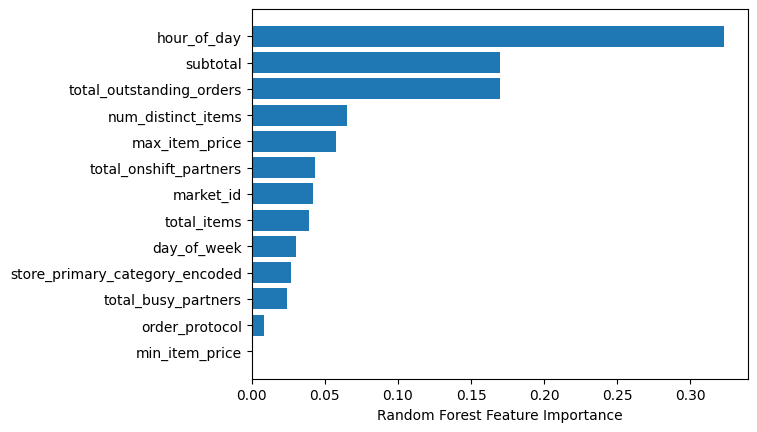

In [169]:
sorted_idx = best_model.feature_importances_.argsort()
plt.barh(feature_names_list[sorted_idx],best_model.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

### Gradient Boosting

In [183]:
# Parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(50, 300),  # Random integers for number of trees
    'learning_rate': uniform(0.01, 0.3),  # Uniform distribution for learning rate
    'max_depth': randint(2, 10),  # Random integers for max depth
    'min_samples_split': randint(2, 20),  # Minimum number of samples required to split an internal node
    'min_samples_leaf': randint(1, 20),  # Minimum number of samples required to be at a leaf node
    'subsample': uniform(0.5, 0.5),  # Uniform distribution for subsampling
    'max_features': ['sqrt', 'log2', None],  # Feature selection for best split
    'alpha': uniform(0.1, 0.9),  # Regularization (for loss function quantile, if applicable)
}

# Define the GradientBoostingRegressor
gbdt_regressor = GradientBoostingRegressor(random_state=42)

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=gbdt_regressor,
    param_distributions=param_dist,
    n_iter=20,  # Number of parameter settings to try
    cv=5,  # Number of folds in cross-validation
    verbose=1,  # Verbosity level for logging
    random_state=42,  # Reproducibility
    n_jobs=-1  # Parallelize across all available cores
)

# Fit the model
random_search.fit(X_train, y_train)

# Output best parameters and score
print("Best parameters found:", random_search.best_params_)
print("Best cross-validated score:", random_search.best_score_)

# Evaluate on the test set
best_model = random_search.best_estimator_
test_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)
print(f"Test Mean Squared Error: {test_mse:.4f}")

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters found: {'alpha': 0.22554447458683766, 'learning_rate': 0.09764339456056544, 'max_depth': 9, 'max_features': None, 'min_samples_leaf': 15, 'min_samples_split': 13, 'n_estimators': 104, 'subsample': 0.9916154429033941}
Best cross-validated score: 0.2954010136439716
Test Mean Squared Error: 225.1610


In [185]:
y_pred = best_model.predict(X_val)
mse = mean_squared_error(y_val,y_pred)
mae = mean_absolute_error(y_val,y_pred)
r2 = r2_score(y_val,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 225.89486836537765
mae 11.087798624497562
r2_score 0.299950197372325


In [186]:
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
r2 = r2_score(y_test,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 225.16102868590355
mae 11.107132023426818
r2_score 0.3022770186828403


Text(0.5, 0, 'Gradient Boosting Feature Importance')

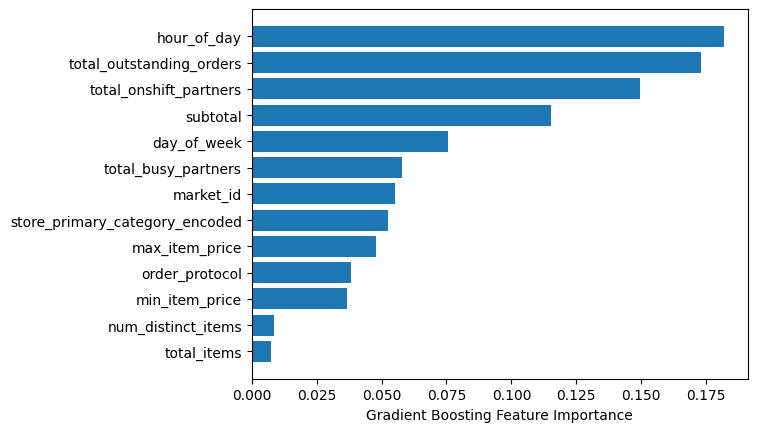

In [187]:
sorted_idx = best_model.feature_importances_.argsort()
plt.barh(feature_names_list[sorted_idx],best_model.feature_importances_[sorted_idx])
plt.xlabel("Gradient Boosting Feature Importance")

## Neural Network

### MLP Regressor

In [6]:
# Parameter distribution for RandomizedSearchCV
param_dist = {
    'hidden_layer_sizes': [(randint.rvs(50, 200),),  # Single hidden layer with size between 50 and 200
                           (randint.rvs(50, 200), randint.rvs(50, 200))],  # Two hidden layers
    'activation': ['relu', 'tanh', 'logistic'],  # Activation functions
    'solver': ['adam'],  # Optimizers
    'alpha': uniform(0.0001, 0.01),  # L2 regularization term (weight decay)
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Learning rate schedule
    'learning_rate_init': uniform(0.001, 0.1),  # Initial learning rate
    'max_iter': randint(200, 1000),  # Maximum number of iterations
    'batch_size': randint(16, 128),  # Mini-batch size
}

# Define the MLPRegressor
mlp_regressor = MLPRegressor(random_state=42)

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=mlp_regressor,
    param_distributions=param_dist,
    n_iter=5,  # Number of parameter settings to try
    cv=5,  # Number of folds in cross-validation
    verbose=1,  # Verbosity level for logging
)

# Fit the model
random_search.fit(X_train, y_train)

# Output best parameters and score
print("Best parameters found:", random_search.best_params_)
print("Best cross-validated score:", random_search.best_score_)

# Evaluate on the test set
best_model = random_search.best_estimator_
test_predictions = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, test_predictions)
print(f"Test Mean Squared Error: {test_mse:.4f}")


Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters found: {'activation': 'tanh', 'alpha': 0.004491690030913374, 'batch_size': 35, 'hidden_layer_sizes': (51,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.014669449886551878, 'max_iter': 313, 'solver': 'adam'}
Best cross-validated score: 0.2396507214159902
Test Mean Squared Error: 244.8576


In [7]:
y_pred = best_model.predict(X_val)
mse = mean_squared_error(y_val,y_pred)
mae = mean_absolute_error(y_val,y_pred)
r2 = r2_score(y_val,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 244.69599240434644
mae 11.709188892740215
r2_score 0.24168538034527387


In [8]:
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
r2 = r2_score(y_test,y_pred)
print("mse",mse)
print("mae",mae)
print("r2_score",r2)

mse 244.85756159428468
mae 11.73829700752315
r2_score 0.24124192862905414


### Keras ANN Regressor

In [188]:
def seed_everything(seed = 42):
    np.random.seed(seed)
    tf.random.set_seed(seed)
seed_everything()

In [189]:
def create_model():
    model = Sequential([
                    Dense(32, activation="relu", input_shape=(13,), kernel_initializer='glorot_uniform',kernel_regularizer=tf.keras.regularizers.l2(0.01),name="hidden_1"),
                    BatchNormalization(),
                    Dropout(0.2),
                    Dense(512, activation="relu",kernel_initializer='glorot_uniform', kernel_regularizer=tf.keras.regularizers.l2(0.01),name="hidden_2"),
                    BatchNormalization(),
                    Dropout(0.2),
                    Dense(1024, activation="relu",kernel_initializer='glorot_uniform', kernel_regularizer=tf.keras.regularizers.l2(0.01),name="hidden_3"),
                    BatchNormalization(),
                    Dropout(0.2),
                    Dense(256, activation="relu",kernel_initializer='glorot_uniform', kernel_regularizer=tf.keras.regularizers.l2(0.01),name="hidden_4"),
                    BatchNormalization(),
                    Dropout(0.2),
                    Dense(128, activation="relu",kernel_initializer='glorot_uniform',name="hidden_5"),
                    Dense(32, activation="relu",kernel_initializer='glorot_uniform',name="hidden_6"),
                    Dense(1, name="output")])
    r2_score = tf.keras.metrics.R2Score(name = "r2_score")
    rmse = tf.keras.metrics.RootMeanSquaredError(name = 'rmse')
    model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1 = 0.9,beta_2 = 0.999),
    loss = "mse",
    metrics=['mse','mae',rmse,r2_score])
    return model

model = create_model()

In [190]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hidden_1 (Dense)                     │ (None, 32)                  │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_2 (Dense)                     │ (None, 512)                 │          16,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_3 (Dense)                     │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_4 (Dense)                     │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_5 (Dense)                     │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_6 (Dense)                     │ (None, 32)                  │           4,128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 849,409 (3.24 MB)

 Trainable params: 845,761 (3.23 MB)

 Non-trainable params: 3,648 (14.25 KB)

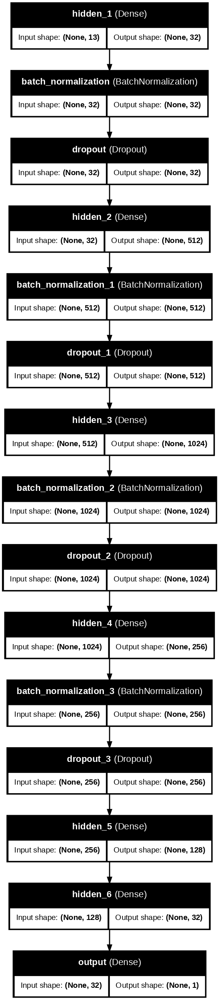

In [191]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,dpi = 100)

# Display the saved image
Image('model.png')

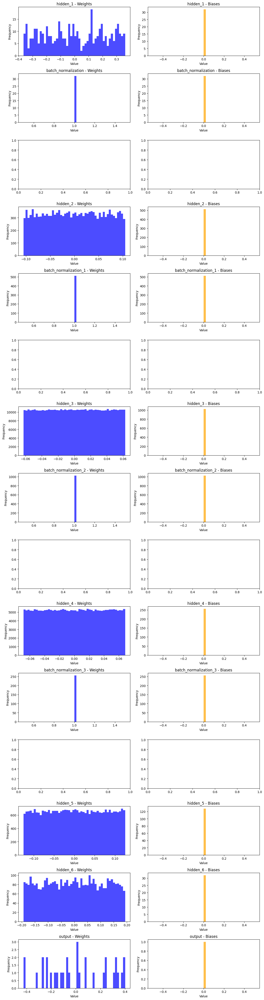

In [192]:
# Create subplots
num_layers = len(model.layers)
fig, axes = plt.subplots(num_layers, 2, figsize=(12, num_layers * 3))  # Adjust figsize for better clarity
axes = axes if num_layers > 1 else [axes]  # Handle single-layer case

# Iterate through layers and plot weights and biases
for i, layer in enumerate(model.layers):
    if layer.weights:  # Only proceed if the layer has weights
        weights = layer.weights[0].numpy().flatten()  # Get weights
        biases = layer.weights[1].numpy().flatten() if len(layer.weights) > 1 else None  # Get biases

        # Plot weights
        axes[i][0].hist(weights, bins=50, align='mid', color='blue', alpha=0.7)
        axes[i][0].set_title(f'{layer.name} - Weights')
        axes[i][0].set_xlabel('Value')
        axes[i][0].set_ylabel('Frequency')

        # Plot biases if available
        if biases is not None:
            axes[i][1].hist(biases, bins=50, align='mid', color='orange', alpha=0.7)
            axes[i][1].set_title(f'{layer.name} - Biases')
            axes[i][1].set_xlabel('Value')
            axes[i][1].set_ylabel('Frequency')
        else:
            axes[i][1].axis('off')  # Turn off the plot if no biases are present

# Adjust layout
plt.tight_layout()
plt.show()

In [193]:
%load_ext tensorboard

In [194]:
log_folder = 'logs'

In [195]:
%reload_ext tensorboard

In [196]:
!rm -rf logs

In [18]:
# def scheduler(epoch, lr):
#   r_0 = 0.01
#   lr = (1/(1+r_0*epoch))*lr
#   return lr
# LRdecay = LearningRateScheduler(scheduler)

In [11]:
# Custom callback
class VerboseCallback(tf.keras.callbacks.Callback):
    # Runs only before the training starts
    def on_train_begin(self, logs=None):
        print("Starting training...")

    # Runs after every epoch
    def on_epoch_end(self, epoch, logs=None):
        if logs is None:
            logs = {}
        if epoch % 10 == 0:
            # Access the R2 score from logs using its name
            r2_score = logs.get('r2_score', 'Not Defined')
            print(f'Epoch {str(epoch).zfill(3)} - loss: {logs["loss"]:.4f} - r2_score: {r2_score}')

    # Runs once training is finished
    def on_train_end(self, logs=None):
        print("...Finished training")

In [198]:
tb_callback = TensorBoard(log_dir=log_folder, histogram_freq=1)

In [12]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',     # Metric to monitor (e.g., 'val_loss' or 'val_accuracy')
    factor=0.1,             # Factor by which the learning rate will be reduced
    patience=5,             # Number of epochs with no improvement before reducing LR
    min_lr=1e-6,            # Lower bound for the learning rate
    verbose=1               # Prints messages when the learning rate is reduced
)

In [13]:
early_stopping = EarlyStopping(
    monitor='val_loss',     # Metric to monitor (e.g., 'val_loss' or 'val_accuracy')
    patience=10,            # Number of epochs with no improvement before stopping training
    verbose=1,              # Prints a message when stopping training
    restore_best_weights=True  # Restores weights from the epoch with the best monitored metric
)

In [201]:
history = model.fit(X_train, y_train, epochs=100, batch_size=1024, validation_data = (X_val, y_val), verbose=0, callbacks=[VerboseCallback(),reduce_lr,early_stopping])

Starting training...
Epoch 000 - loss: 553.0206 - r2_score: -0.6924039125442505
Epoch 010 - loss: 259.7244 - r2_score: 0.20882737636566162
Epoch 020 - loss: 252.5550 - r2_score: 0.22603857517242432

Epoch 30: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
Epoch 030 - loss: 246.6955 - r2_score: 0.24326348304748535
Epoch 040 - loss: 244.1792 - r2_score: 0.2490922212600708
Epoch 050 - loss: 243.2418 - r2_score: 0.2506027817726135
Epoch 060 - loss: 242.0361 - r2_score: 0.2534177303314209

Epoch 61: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
Epoch 070 - loss: 241.8328 - r2_score: 0.2539106011390686
Epoch 080 - loss: 241.2524 - r2_score: 0.25562596321105957

Epoch 81: ReduceLROnPlateau reducing learning rate to 1.0000000656873453e-06.
Epoch 090 - loss: 241.2075 - r2_score: 0.25575143098831177
...Finished training
Restoring model weights from the end of the best epoch: 98.


In [202]:
%tensorboard --logdir={log_folder}

<IPython.core.display.Javascript object>

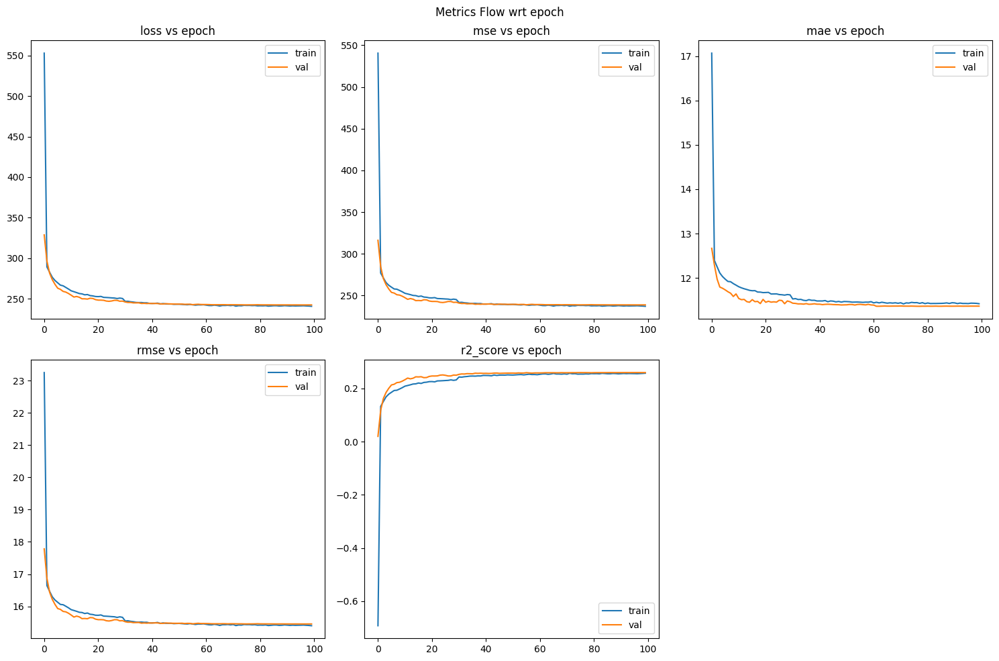

In [203]:
fig = plt.figure(figsize = (15,10))
plt.suptitle("Metrics Flow wrt epoch")
k = 1
for i in ['loss','mse','mae','rmse','r2_score']:
  plt.subplot(2,3,k)
  plt.title(f"{i} vs epoch",)
  k += 1
  plt.plot(history.epoch, history.history[f"{i}"], label="train")
  plt.plot(history.epoch, history.history[f"val_{i}"], label="val")
  plt.legend()
plt.tight_layout()
plt.show()
warnings.filterwarnings('ignore')

In [204]:
_,mse,mae,rmse,r2_score = model.evaluate(X_train,y_train)
print("mse",mse)
print("mae",mae)
print("rmse",rmse)
print("r2_score",r2_score)

3860/3860 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 234.0589 - mae: 11.1892 - mse: 230.5723 - r2_score: 0.2816 - rmse: 15.1840
mse 229.8775634765625
mae 11.178385734558105
rmse 15.161713600158691
r2_score 0.2803151607513428


In [205]:
_,mse,mae,rmse,r2_score = model.evaluate(X_val,y_val)
print("mse",mse)
print("mae",mae)
print("rmse",rmse)
print("r2_score",r2_score)

986/986 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 244.9355 - mae: 11.4166 - mse: 241.4492 - r2_score: 0.2584 - rmse: 15.5379
mse 238.80955505371094
mae 11.36512279510498
rmse 15.45346450805664
r2_score 0.2599251866340637


In [206]:
_,mse,mae,rmse,r2_score = model.evaluate(X_test,y_test)
print("mse",mse)
print("mae",mae)
print("rmse",rmse)
print("r2_score",r2_score)

1232/1232 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 241.4288 - mae: 11.3760 - mse: 237.9424 - r2_score: 0.2602 - rmse: 15.4247
mse 238.25865173339844
mae 11.368541717529297
rmse 15.435628890991211
r2_score 0.2616840600967407


### Hyper parameter tuning

In [207]:
def build_model(hp):
    model = Sequential()
    
    # Input layer
    model.add(Dense(
        units=hp.Int('units_hidden_1', min_value=16, max_value=1024, step=128),
        kernel_initializer=hp.Choice('kernel_initializer_hidden_1', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
        kernel_regularizer=tf.keras.regularizers.l2(hp.Float('l2_reg_hidden_1', min_value=0.001, max_value=0.01, step=0.001)),
        input_shape=(13,),
        name="hidden_1"
    ))
    # Adding activation: Choice between 'relu', 'tanh', 'sigmoid', and 'leaky_relu'
    activation_choice = hp.Choice('activation_hidden_1', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
    if activation_choice == 'leaky_relu':
        model.add(tf.keras.layers.LeakyReLU(alpha=hp.Float('leaky_relu_alpha_hidden_1', min_value=0.01, max_value=0.3, step=0.01)))
    else:
        model.add(tf.keras.layers.Activation(activation_choice))
    
    # Optional Batch Normalization
    if hp.Choice('batch_norm_hidden_1', values=[True, False]):
        model.add(BatchNormalization())
    
    # Optional Dropout
    if hp.Choice('dropout_hidden_1', values=[True, False]):
        model.add(Dropout(hp.Float('dropout_rate_hidden_1', min_value=0.1, max_value=0.5, step=0.1)))

    # Additional hidden layers
    for i in range(hp.Int('num_hidden_layers', min_value=1, max_value=5)):
        model.add(Dense(
            units=hp.Int(f'units_hidden_{i+2}', min_value=16, max_value=128, step=16),
            kernel_initializer=hp.Choice(f'kernel_initializer_hidden_{i+2}', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
            kernel_regularizer=tf.keras.regularizers.l2(hp.Float(f'l2_reg_hidden_{i+2}', min_value=0.001, max_value=0.01, step=0.001)),
            name=f"hidden_{i+2}"
        ))
        # Adding activation: Choice between 'relu', 'tanh', 'sigmoid', and 'leaky_relu'
        activation_choice = hp.Choice(f'activation_hidden_{i+2}', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
        if activation_choice == 'leaky_relu':
            model.add(tf.keras.layers.LeakyReLU(alpha=hp.Float(f'leaky_relu_alpha_hidden_{i+2}', min_value=0.01, max_value=0.3, step=0.01)))
        else:
            model.add(tf.keras.layers.Activation(activation_choice))
        
        # Optional Batch Normalization
        if hp.Choice(f'batch_norm_hidden_{i+2}', values=[True, False]):
            model.add(BatchNormalization())
        
        # Optional Dropout
        if hp.Choice(f'dropout_hidden_{i+2}', values=[True, False]):
            model.add(Dropout(hp.Float(f'dropout_rate_hidden_{i+2}', min_value=0.1, max_value=0.5, step=0.1)))

    # Output layer
    model.add(Dense(1, name="output"))

    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
        ),
        loss='mse',
        metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(name='rmse'), tf.keras.metrics.R2Score(name='r2_score')]
    )
    return model


In [208]:
from keras_tuner import RandomSearch

# Initialize the tuner
tuner = RandomSearch(
    build_model,
    objective='val_loss',           # Optimize for validation loss
    max_trials=100,                  # Number of hyperparameter combinations to test
    executions_per_trial=1,         # Number of model evaluations per trial
    directory='my_dir',             # Directory to store the results
    project_name='keras_tuner_final'
)

# Perform hyperparameter search
tuner.search(
    X_train, y_train,
    epochs=50,
    batch_size=1024,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, reduce_lr],  # Optional callbacks
    verbose=2
)


Trial 100 Complete [00h 01m 16s]
val_loss: 248.5394744873047

Best val_loss So Far: 236.30532836914062
Total elapsed time: 02h 01m 24s


In [210]:
# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best hyperparameters:")
print(f"Hidden layer units: {best_hps.get('units_hidden_1')}")
print(f"Learning rate: {best_hps.get('learning_rate')}")
print(f"Dropout: {best_hps.get('dropout_hidden_1')}")

Best hyperparameters:
Hidden layer units: 144
Learning rate: 0.009742209100555859
Dropout: 0


In [211]:
# Build the best model using the best hyperparameters
best_model = tuner.hypermodel.build(best_hps)


In [212]:
# Train the best model with more epochs
history = best_model.fit(
    X_train, y_train,
    epochs=500,               # Use more epochs for fine-tuning
    batch_size=512,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, reduce_lr],  # Optional callbacks
    verbose=1
)


Epoch 1/500
242/242 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 1002.0906 - mae: 24.5261 - mse: 1000.7904 - r2_score: -2.0964 - rmse: 30.6896 - val_loss: 282.6367 - val_mae: 11.9906 - val_mse: 280.9760 - val_r2_score: 0.1293 - val_rmse: 16.7623 - learning_rate: 0.0097
Epoch 2/500
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 271.6029 - mae: 12.1092 - mse: 269.9513 - r2_score: 0.1618 - rmse: 16.4291 - val_loss: 260.6656 - val_mae: 11.8038 - val_mse: 259.0254 - val_r2_score: 0.1973 - val_rmse: 16.0943 - learning_rate: 0.0097
Epoch 3/500
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 263.0766 - mae: 11.9703 - mse: 261.4382 - r2_score: 0.1882 - rmse: 16.1684 - val_loss: 255.5723 - val_mae: 11.7756 - val_mse: 253.8991 - val_r2_score: 0.2132 - val_rmse: 15.9342 - learning_rate: 0.0097
Epoch 4/500
242/242 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 259.3125 - mae: 11.8847 - mse: 257.5959 - r2_score: 0.2001 - rmse: 16.0491 - val_loss: 252.6049 - val_mae: 11.6576 - val_mse: 250.7241 - val_r2_sco

In [213]:
# Save the trained best model
best_model.save('best_model.keras')

# Load it later using:
# from tensorflow.keras.models import load_model
# model = load_model('best_model.keras')


In [214]:
best_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hidden_1 (Dense)                     │ (None, 144)                 │           2,016 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 144)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 144)                 │             576 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_2 (Dense)                     │ (None, 80)                  │          11,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 80)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 80)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 1)                   │              81 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 42,245 (165.02 KB)

 Trainable params: 13,985 (54.63 KB)

 Non-trainable params: 288 (1.12 KB)

 Optimizer params: 27,972 (109.27 KB)

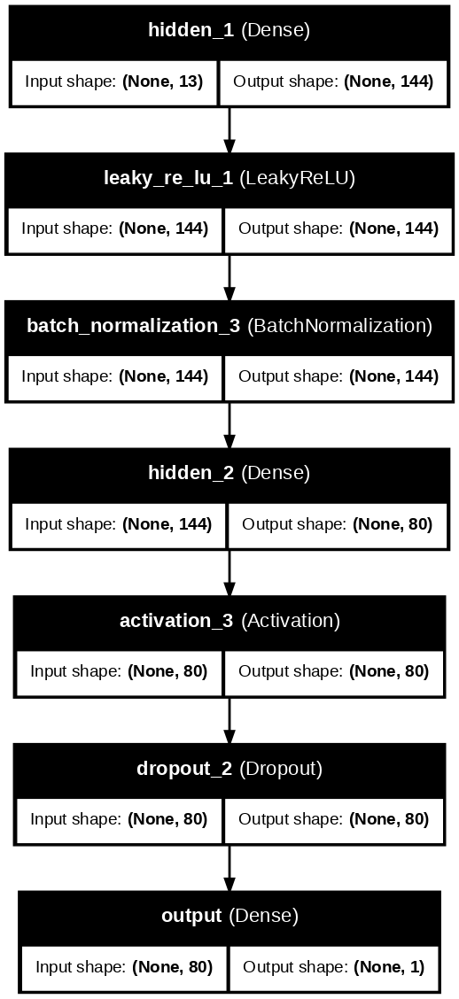

In [215]:
plot_model(best_model, to_file='best_model.png', show_shapes=True, show_layer_names=True,dpi = 100)

# Display the saved image
Image('best_model.png')

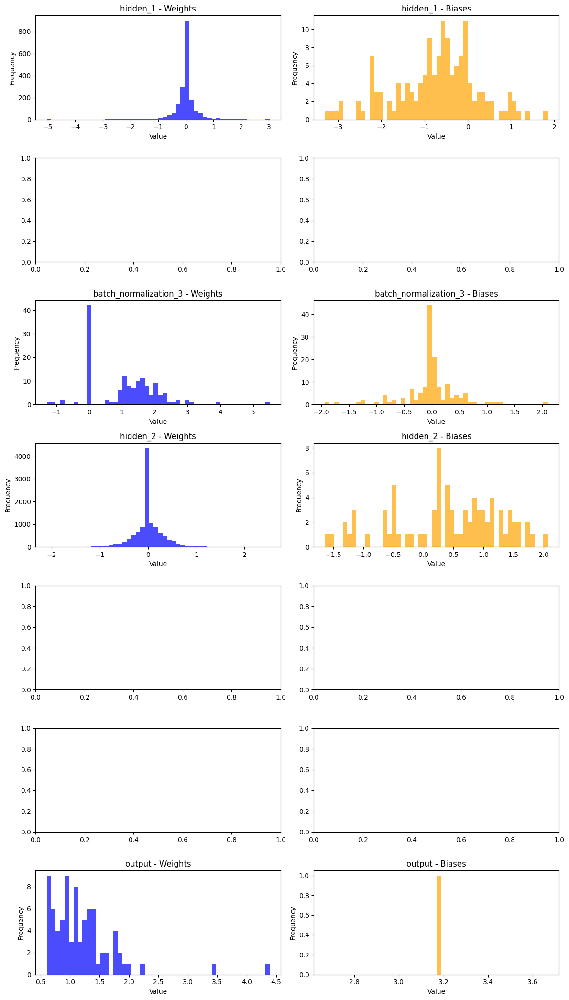

In [216]:
# Create subplots
num_layers = len(best_model.layers)
fig, axes = plt.subplots(num_layers, 2, figsize=(12, num_layers * 3))  # Adjust figsize for better clarity
axes = axes if num_layers > 1 else [axes]  # Handle single-layer case

# Iterate through layers and plot weights and biases
for i, layer in enumerate(best_model.layers):
    if layer.weights:  # Only proceed if the layer has weights
        weights = layer.weights[0].numpy().flatten()  # Get weights
        biases = layer.weights[1].numpy().flatten() if len(layer.weights) > 1 else None  # Get biases

        # Plot weights
        axes[i][0].hist(weights, bins=50, align='mid', color='blue', alpha=0.7)
        axes[i][0].set_title(f'{layer.name} - Weights')
        axes[i][0].set_xlabel('Value')
        axes[i][0].set_ylabel('Frequency')

        # Plot biases if available
        if biases is not None:
            axes[i][1].hist(biases, bins=50, align='mid', color='orange', alpha=0.7)
            axes[i][1].set_title(f'{layer.name} - Biases')
            axes[i][1].set_xlabel('Value')
            axes[i][1].set_ylabel('Frequency')
        else:
            axes[i][1].axis('off')  # Turn off the plot if no biases are present

# Adjust layout
plt.tight_layout()
plt.show()

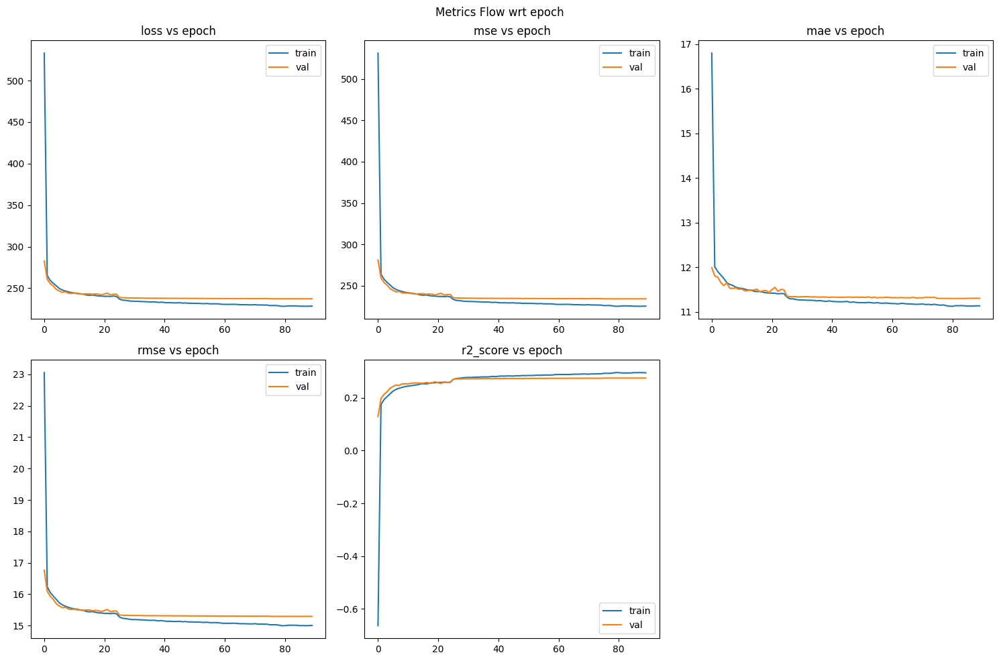

In [217]:
fig = plt.figure(figsize = (15,10))
plt.suptitle("Metrics Flow wrt epoch")
k = 1
for i in ['loss','mse','mae','rmse','r2_score']:
  plt.subplot(2,3,k)
  plt.title(f"{i} vs epoch",)
  k += 1
  plt.plot(history.epoch, history.history[f"{i}"], label="train")
  plt.plot(history.epoch, history.history[f"val_{i}"], label="val")
  plt.legend()
plt.tight_layout()
plt.show()
warnings.filterwarnings('ignore')

In [218]:
_,mse,mae,rmse,r2_score = best_model.evaluate(X_train,y_train)
print("mse",mse)
print("mae",mae)
print("rmse",rmse)
print("r2_score",r2_score)

3860/3860 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 224.6879 - mae: 10.9978 - mse: 221.4742 - r2_score: 0.3099 - rmse: 14.8815
mse 220.5780029296875
mae 10.99404239654541
rmse 14.851868629455566
r2_score 0.3094296455383301


In [219]:
_,mse,mae,rmse,r2_score = best_model.evaluate(X_val,y_val)


986/986 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 239.9891 - mae: 11.3525 - mse: 236.7755 - r2_score: 0.2726 - rmse: 15.3870


In [220]:
_,mse,mae,rmse,r2_score = best_model.evaluate(X_test,y_test)


1232/1232 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 235.1891 - mae: 11.3150 - mse: 231.9753 - r2_score: 0.2788 - rmse: 15.2301


### Multi-Branch NN 

In [222]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2

def build_model(hp):
    # Input layer
    inputs = Input(shape=(13,), name="input")

    # Branch 1
    x1 = Dense(
        units=hp.Int('units_branch_1', min_value=16, max_value=128, step=16),
        kernel_initializer=hp.Choice('kernel_initializer_branch_1', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
        kernel_regularizer=l2(hp.Float('l2_reg_branch_1', min_value=0.001, max_value=0.01, step=0.001)),
        name="branch_1_layer_1"
    )(inputs)
    activation_choice_1 = hp.Choice('activation_branch_1', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
    if activation_choice_1 == 'leaky_relu':
        x1 = tf.keras.layers.LeakyReLU(alpha=hp.Float('leaky_relu_alpha_branch_1', min_value=0.01, max_value=0.3, step=0.01))(x1)
    else:
        x1 = tf.keras.layers.Activation(activation_choice_1)(x1)
    if hp.Choice('batch_norm_branch_1', values=[True, False]):
        x1 = BatchNormalization()(x1)
    if hp.Choice('dropout_branch_1', values=[True, False]):
        x1 = Dropout(hp.Float('dropout_rate_branch_1', min_value=0.1, max_value=0.5, step=0.1))(x1)

    # Branch 2
    x2 = Dense(
        units=hp.Int('units_branch_2', min_value=16, max_value=128, step=16),
        kernel_initializer=hp.Choice('kernel_initializer_branch_2', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
        kernel_regularizer=l2(hp.Float('l2_reg_branch_2', min_value=0.001, max_value=0.01, step=0.001)),
        name="branch_2_layer_1"
    )(inputs)
    activation_choice_2 = hp.Choice('activation_branch_2', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
    if activation_choice_2 == 'leaky_relu':
        x2 = tf.keras.layers.LeakyReLU(alpha=hp.Float('leaky_relu_alpha_branch_2', min_value=0.01, max_value=0.3, step=0.01))(x2)
    else:
        x2 = tf.keras.layers.Activation(activation_choice_2)(x2)
    if hp.Choice('batch_norm_branch_2', values=[True, False]):
        x2 = BatchNormalization()(x2)
    if hp.Choice('dropout_branch_2', values=[True, False]):
        x2 = Dropout(hp.Float('dropout_rate_branch_2', min_value=0.1, max_value=0.5, step=0.1))(x2)

    # Branch 3
    x3 = Dense(
        units=hp.Int('units_branch_3', min_value=16, max_value=128, step=16),
        kernel_initializer=hp.Choice('kernel_initializer_branch_3', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
        kernel_regularizer=l2(hp.Float('l2_reg_branch_3', min_value=0.001, max_value=0.01, step=0.001)),
        name="branch_3_layer_1"
    )(inputs)
    activation_choice_3 = hp.Choice('activation_branch_3', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
    if activation_choice_3 == 'leaky_relu':
        x3 = tf.keras.layers.LeakyReLU(alpha=hp.Float('leaky_relu_alpha_branch_3', min_value=0.01, max_value=0.3, step=0.01))(x3)
    else:
        x3 = tf.keras.layers.Activation(activation_choice_3)(x3)
    if hp.Choice('batch_norm_branch_3', values=[True, False]):
        x3 = BatchNormalization()(x3)
    if hp.Choice('dropout_branch_3', values=[True, False]):
        x3 = Dropout(hp.Float('dropout_rate_branch_3', min_value=0.1, max_value=0.5, step=0.1))(x3)

    # Concatenate branches
    concatenated = Concatenate(name="concatenated")([x1, x2, x3])

    # Shared Dense Layer
    shared = Dense(
        units=hp.Int('units_shared', min_value=16, max_value=128, step=16),
        kernel_initializer=hp.Choice('kernel_initializer_shared', values=['glorot_uniform', 'he_uniform', 'lecun_normal']),
        kernel_regularizer=l2(hp.Float('l2_reg_shared', min_value=0.001, max_value=0.01, step=0.001)),
        name="shared_layer"
    )(concatenated)
    shared_activation = hp.Choice('activation_shared', values=['relu', 'tanh', 'sigmoid', 'leaky_relu'])
    if shared_activation == 'leaky_relu':
        shared = tf.keras.layers.LeakyReLU(alpha=hp.Float('leaky_relu_alpha_shared', min_value=0.01, max_value=0.3, step=0.01))(shared)
    else:
        shared = tf.keras.layers.Activation(shared_activation)(shared)

    # Output Layer
    outputs = Dense(1, name="output")(shared)

    # Define Model
    model = Model(inputs=inputs, outputs=outputs, name="Parallel_Model")

    # Compile Model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='log')
        ),
        loss='mse',
        metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(name='rmse')]
    )

    return model


In [223]:
from keras_tuner import RandomSearch

# Initialize the tuner
tuner = RandomSearch(
    build_model,
    objective='val_loss',           # Optimize for validation loss
    max_trials=25,                  # Number of hyperparameter combinations to test
    executions_per_trial=1,         # Number of model evaluations per trial
    directory='my_dir',             # Directory to store the results
    project_name='keras_tuner_multi'
)

# Perform hyperparameter search
tuner.search(
    X_train, y_train,
    epochs=50,
    batch_size=1024,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, reduce_lr],  # Optional callbacks
    verbose=2
)


Trial 25 Complete [00h 00m 50s]
val_loss: 248.38381958007812

Best val_loss So Far: 237.45274353027344
Total elapsed time: 00h 17m 44s


In [228]:
# Retrieve the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


In [229]:
# Build the best model using the best hyperparameters
best_model = tuner.hypermodel.build(best_hps)


In [9]:
from tensorflow.keras.models import load_model

# Load the model
best_model = load_model('/kaggle/input/keras_model/keras/default/1/best_model_multi.keras')


In [22]:
# Train the best model with more epochs
history = best_model.fit(
    X_train, y_train,
    epochs=500,               # Use more epochs for fine-tuning
    batch_size=1024,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping, reduce_lr],  # Optional callbacks
    verbose=1
)


Epoch 1/500
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 229.0507 - mae: 11.1252 - mse: 226.3943 - rmse: 15.0454 - val_loss: 234.3656 - val_mae: 11.2443 - val_mse: 231.7092 - val_rmse: 15.2220 - learning_rate: 1.0000e-06
Epoch 2/500
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 226.3757 - mae: 11.1088 - mse: 223.7193 - rmse: 14.9571 - val_loss: 234.3720 - val_mae: 11.2427 - val_mse: 231.7156 - val_rmse: 15.2222 - learning_rate: 1.0000e-06
Epoch 3/500
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 225.5920 - mae: 11.0853 - mse: 222.9357 - rmse: 14.9309 - val_loss: 234.3745 - val_mae: 11.2411 - val_mse: 231.7182 - val_rmse: 15.2223 - learning_rate: 1.0000e-06
Epoch 4/500
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 224.7158 - mae: 11.0444 - mse: 222.0595 - rmse: 14.9006 - val_loss: 234.3745 - val_mae: 11.2429 - val_mse: 231.7182 - val_rmse: 15.2223 - learning_rate: 1.0000e-06
Epoch 5/500
121/121 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 229.9074 - mae: 11.1413 - mse: 227.2511

In [233]:
# Save the trained best model
best_model.save('best_model_multi.keras')

# Load it later using:
# from tensorflow.keras.models import load_model
# model = load_model('best_model.keras')


In [234]:
best_model.summary()

Model: "Parallel_Model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)        │ (None, 13)             │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ branch_1_layer_1 (Dense)  │ (None, 128)            │          1,792 │ input[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activation) │ (None, 128)            │              0 │ branch_1_layer_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ branch_2_layer_1 (Dense)  │ (None, 16)             │            224 │ input[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ branch_3_layer_1 (Dense)  │ (None, 48)             │            672 │ input[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 128)            │            512 │ activation_4[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_4 (LeakyReLU) │ (None, 16)             │              0 │ branch_2_layer_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_5 (Activation) │ (None, 48)             │              0 │ branch_3_layer_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 128)            │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 16)             │              0 │ leaky_re_lu_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_5     │ (None, 48)             │            192 │ activation_5[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenated              │ (None, 192)            │              0 │ dropout_3[0][0],       │
│ (Concatenate)             │                        │                │ dropout_4[0][0],       │
│                           │                        │                │ batch_normalization_5… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ shared_layer (Dense)      │ (None, 64)             │         12,352 │ concatenated[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ leaky_re_lu_5 (LeakyReLU) │ (None, 64)             │              0 │ shared_layer[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (Dense)            │ (None, 1)              │             65 │ leaky_re_lu_5[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 46,725 (182.52 KB)

 Trainable params: 15,457 (60.38 KB)

 Non-trainable params: 352 (1.38 KB)

 Optimizer params: 30,916 (120.77 KB)

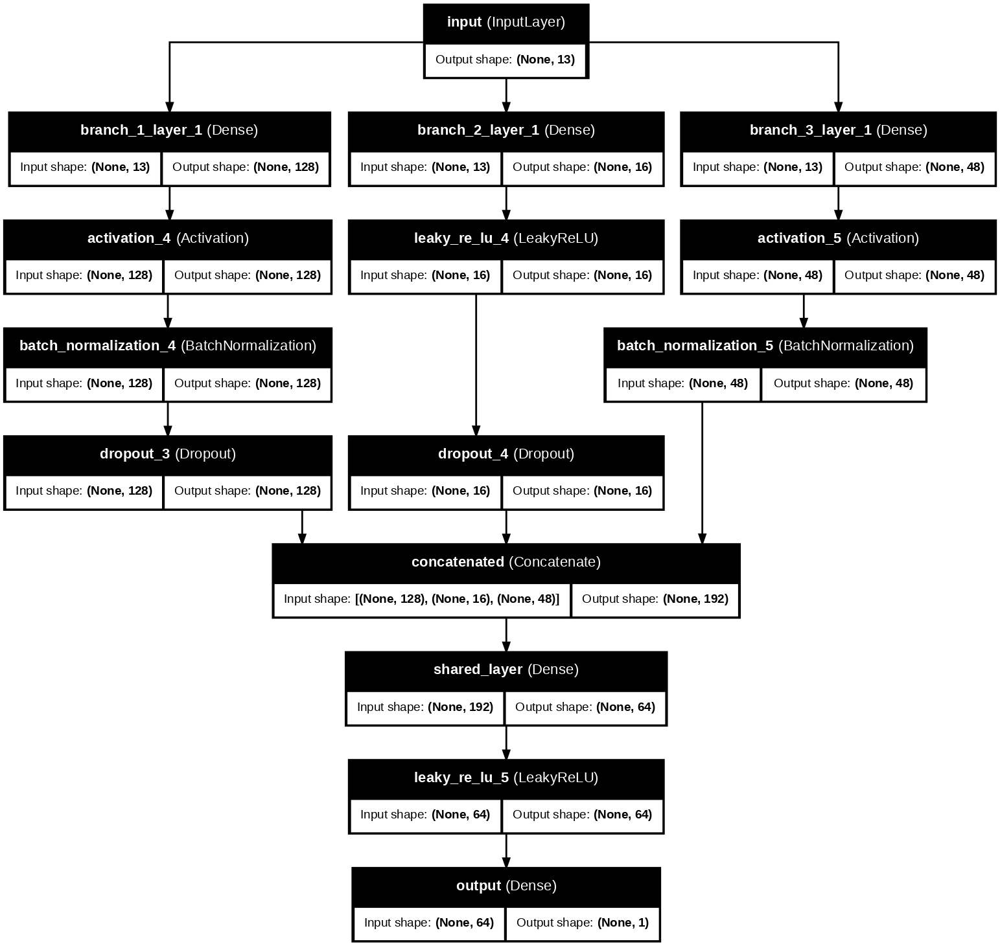

In [235]:
plot_model(best_model, to_file='best_model_multi.png', show_shapes=True, show_layer_names=True,dpi = 100)

# Display the saved image
Image('best_model_multi.png')

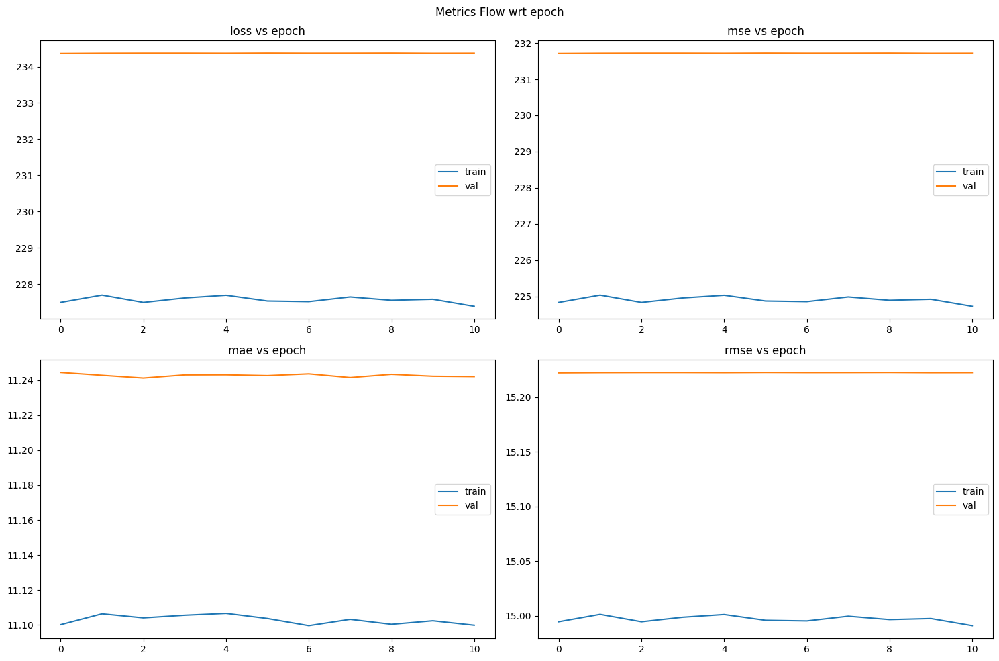

In [23]:
fig = plt.figure(figsize = (15,10))
plt.suptitle("Metrics Flow wrt epoch")
k = 1
for i in ['loss','mse','mae','rmse']:
  plt.subplot(2,2,k)
  plt.title(f"{i} vs epoch",)
  k += 1
  plt.plot(history.epoch, history.history[f"{i}"], label="train")
  plt.plot(history.epoch, history.history[f"val_{i}"], label="val")
  plt.legend()
plt.tight_layout()
plt.show()
warnings.filterwarnings('ignore')

In [18]:
_,mse,mae,rmse = best_model.evaluate(X_train,y_train)
print("mse",mse)
print("mae",mae)
print("rmse",rmse)

3860/3860 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - loss: 227.5082 - mae: 11.0688 - mse: 224.8520 - rmse: 14.9946
mse 223.7862091064453
mae 11.068163871765137
rmse 14.95948600769043


In [19]:
_,mse,mae,rmse = best_model.evaluate(X_val,y_val)


986/986 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 237.0928 - mae: 11.2979 - mse: 234.4364 - rmse: 15.3108


In [20]:
_,mse,mae,rmse = best_model.evaluate(X_test,y_test)


1232/1232 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - loss: 233.3784 - mae: 11.2818 - mse: 230.7220 - rmse: 15.1888


### Feature Importances using SHAP

In [7]:
!pip install shap

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [8]:
import shap


In [9]:
from tensorflow.keras.models import load_model

# Load the model
best_model = load_model('/kaggle/input/keras_model/keras/default/1/best_model.keras')


In [10]:

from sklearn.cluster import KMeans
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters).fit(X_train)
background = kmeans.cluster_centers_

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


In [11]:
explainer = shap.KernelExplainer(best_model.predict, background)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 681ms/step


In [18]:
shap_values = explainer.shap_values(X_train[:1000])  # Use first 100 samples only

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
325/325 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
325/325 ━━━━

In [ ]:
# For neural network models, we use KernelExplainer
explainer = shap.KernelExplainer(best_model.predict, X_train[:50])  # Use a subset of X_train for background data
shap_values = explainer.shap_values(X_train)  # Calculate SHAP values

In [19]:
X_train = pd.DataFrame(X_train, columns=feature_names_list)

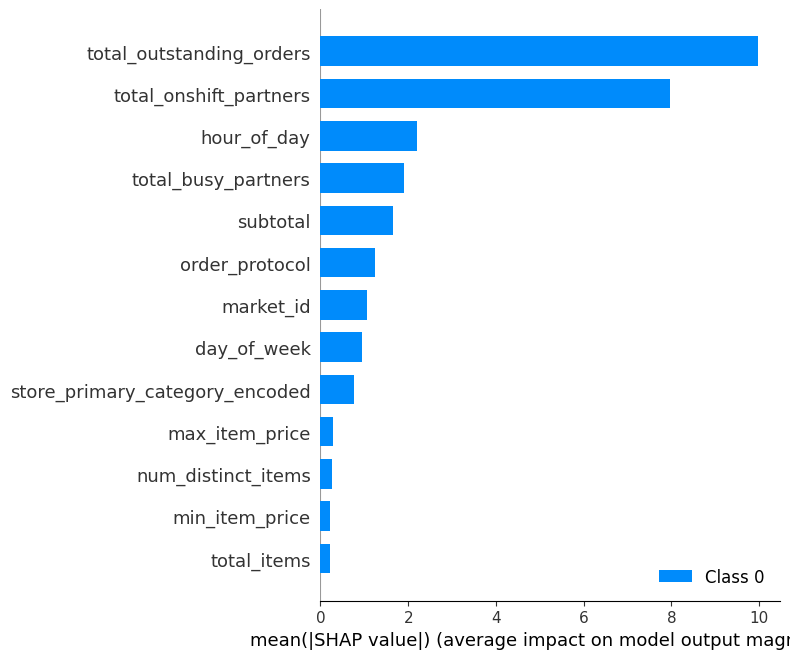

In [20]:
# SHAP Summary plot (Bar chart for feature importance)
shap.summary_plot(shap_values, X_train[:1000], plot_type="bar")

## INSIGHTS

#### Tradional ML Methods

> Traditional ML Ensemble methods like Random Forest and Gradient Boosting Regressors are used initially. Metrics obtained are -
1. Random Forest Regressor
   1. Validation Score
       1. mse 286.6935026609573
       2. mae 12.613520609389713
       3. r2_score 0.11153479755983375
    2. Testing score
       1. mse 286.10476129894823
       2. mae 12.662683686628036
       3. r2_score 0.1134262079562347
    3. Top 3 Features based on Feature importances
       1. hour_of_day
       2. subtotal
       3. total_outstanding_orders
       4. num_distinct_items
       5. max_item_price
 2. Gradient Boosting Regressor
    1. Validation Score
       1. mse 225.89486836537765
       2. mae 11.087798624497562
       3. r2_score 0.299950197372325
    2. Testing score
       1. mse 225.16102868590355
       2. mae 11.107132023426818
       3. r2_score 0.3022770186828403
    3. Top 3 Features based on Feature importances
       1. hour_of_day
       2. total_outstanding_orders
       3. total_onshift_partners
       4. subtotal
       5. day_of_week

#### MLP Regressor from sklearn

Best_model - `{'activation': 'tanh', 'alpha': 0.004491690030913374, 'batch_size': 35, 'hidden_layer_sizes': (51,), 'learning_rate': 'adaptive', 'learning_rate_init': 0.014669449886551878, 'max_iter': 313, 'solver': 'adam'}`

Metrics obtained are - 
1. Validation Score
   1. mse 244.69599240434644
   2. mae 11.709188892740215
   3. r2_score 0.24168538034527387
2. Testing score
   1. mse 244.85756159428468
   2. mae 11.73829700752315
   3. r2_score 0.24124192862905414

#### Keras ANN Regressor

> Initially 6 hidden layer architecture was used.
<pre style="white-space:pre;overflow-x:auto;line-height:normal;font-family:Menlo,'DejaVu Sans Mono',consolas,'Courier New',monospace">┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃<span style="font-weight: bold"> Layer (type)                         </span>┃<span style="font-weight: bold"> Output Shape                </span>┃<span style="font-weight: bold">         Param # </span>┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hidden_1 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">32</span>)                  │             <span style="color: #00af00; text-decoration-color: #00af00">448</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">32</span>)                  │             <span style="color: #00af00; text-decoration-color: #00af00">128</span> │
│ (<span style="color: #0087ff; text-decoration-color: #0087ff">BatchNormalization</span>)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (<span style="color: #0087ff; text-decoration-color: #0087ff">Dropout</span>)                    │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">32</span>)                  │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_2 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">512</span>)                 │          <span style="color: #00af00; text-decoration-color: #00af00">16,896</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">512</span>)                 │           <span style="color: #00af00; text-decoration-color: #00af00">2,048</span> │
│ (<span style="color: #0087ff; text-decoration-color: #0087ff">BatchNormalization</span>)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dropout</span>)                  │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">512</span>)                 │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_3 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">1024</span>)                │         <span style="color: #00af00; text-decoration-color: #00af00">525,312</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">1024</span>)                │           <span style="color: #00af00; text-decoration-color: #00af00">4,096</span> │
│ (<span style="color: #0087ff; text-decoration-color: #0087ff">BatchNormalization</span>)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dropout</span>)                  │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">1024</span>)                │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_4 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">256</span>)                 │         <span style="color: #00af00; text-decoration-color: #00af00">262,400</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">256</span>)                 │           <span style="color: #00af00; text-decoration-color: #00af00">1,024</span> │
│ (<span style="color: #0087ff; text-decoration-color: #0087ff">BatchNormalization</span>)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dropout</span>)                  │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">256</span>)                 │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_5 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">128</span>)                 │          <span style="color: #00af00; text-decoration-color: #00af00">32,896</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_6 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">32</span>)                  │           <span style="color: #00af00; text-decoration-color: #00af00">4,128</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                       │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">1</span>)                   │              <span style="color: #00af00; text-decoration-color: #00af00">33</span> │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘
</pre>

Metrics Obtained are-
1. Training Score
   1. mse 229.8775634765625
   2. mae 11.178385734558105
   3. rmse 15.161713600158691
   4. r2_score 0.2803151607513428
2. Validation Score
   1. mse 238.80955505371094
   2. mae 11.36512279510498
   3. rmse 15.45346450805664
   4. r2_score 0.2599251866340637
3. Test Score
   1. mse 238.25865173339844
   2. mae 11.368541717529297
   3. rmse 15.435628890991211
   4. r2_score 0.2616840600967407

> Gradient Boosting Regressor was better performed than above ANN regressor

#### Hyper tuned Keras ANN Regressor using Keras tuner

> After apply keras tuner two hidden layer architecture with dropout and normalization is obtained as follows.
<pre style="white-space:pre;overflow-x:auto;line-height:normal;font-family:Menlo,'DejaVu Sans Mono',consolas,'Courier New',monospace">┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃<span style="font-weight: bold"> Layer (type)                         </span>┃<span style="font-weight: bold"> Output Shape                </span>┃<span style="font-weight: bold">         Param # </span>┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hidden_1 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">144</span>)                 │           <span style="color: #00af00; text-decoration-color: #00af00">2,016</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (<span style="color: #0087ff; text-decoration-color: #0087ff">LeakyReLU</span>)            │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">144</span>)                 │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">144</span>)                 │             <span style="color: #00af00; text-decoration-color: #00af00">576</span> │
│ (<span style="color: #0087ff; text-decoration-color: #0087ff">BatchNormalization</span>)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ hidden_2 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                     │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">80</span>)                  │          <span style="color: #00af00; text-decoration-color: #00af00">11,600</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (<span style="color: #0087ff; text-decoration-color: #0087ff">Activation</span>)            │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">80</span>)                  │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (<span style="color: #0087ff; text-decoration-color: #0087ff">Dropout</span>)                  │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">80</span>)                  │               <span style="color: #00af00; text-decoration-color: #00af00">0</span> │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (<span style="color: #0087ff; text-decoration-color: #0087ff">Dense</span>)                       │ (<span style="color: #00d7ff; text-decoration-color: #00d7ff">None</span>, <span style="color: #00af00; text-decoration-color: #00af00">1</span>)                   │              <span style="color: #00af00; text-decoration-color: #00af00">81</span> │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘
</pre>

Metrics Obtained are - 
1. Training score
   1. mse 220.5780029296875
   2. mae 10.99404239654541
   3. rmse 14.851868629455566
   4. r2_score 0.3094296455383301
2. Validation Score
   1. mse: 236.7755
   2. mae: 11.3525
   3. rmse: 15.3870
   4. r2_score: 0.2726
3. Testing Score
   1. mse: 231.9753
   2. mae: 11.3150
   3. rmse: 15.2301
   4. r2_score: 0.2788

#### Multi Branch hyper tuned Keras ANN Regressor

> Created hyper tuning model using 3 parallel layer architecture. Obtained model is

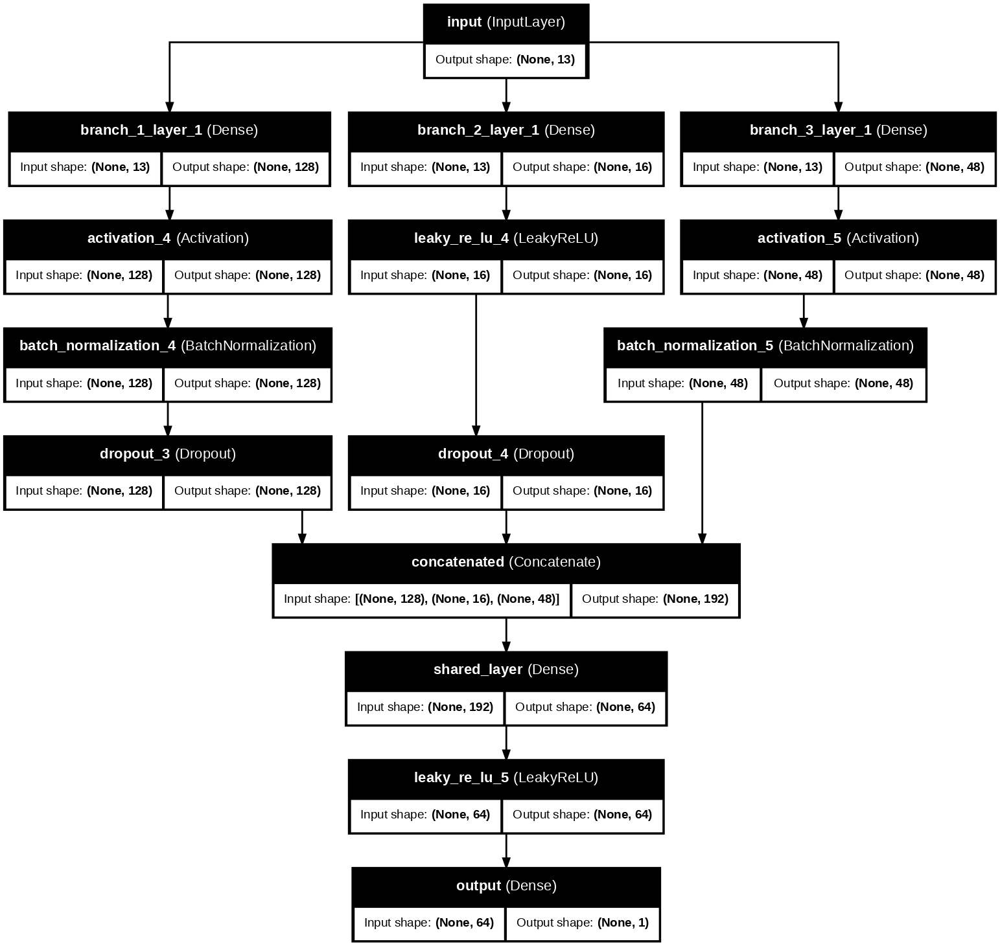


Metrics Obtained are - 
1. Training score
   1. mse 223.7862091064453
   2. mae 11.068163871765137
   3. rmse 14.95948600769043
2. Validation Score
   1. mse: 234.4364
   2. mae: 11.2979
   3. rmse: 15.3108
3. Testing Score
   1. mse: 230.7220
   2. mae: 11.2818
   3. rmse: 15.1888

> Overall Gradient Boosting regressor has slightly better metrics than keras ann regressors

#### Feature Importance using SHAP
> SHAPley values are calculated for 5 kmeans centroids using first 1000 rows.

> Top 5 features are
1. total_outstanding_orders
2. total_onshift_partners
3. hour_of_day
4. total_busy_partners
5. subtotal

# CHAPTER 6: INSIGHTS AND RECOMMENDATIONS

## OVERALL INSIGHTS

1. **Model Performance Comparison**  
   - **Gradient Boosting Regressor** outperforms other models, achieving better R² scores and lower errors on both validation and test datasets compared to Random Forest and ANN models.  
   - The ANN model, despite optimization through Keras Tuner, remains slightly less effective than Gradient Boosting, with higher mean squared error (MSE) and mean absolute error (MAE).  
   - Gradient Boosting highlights critical features like `hour_of_day`, `total_outstanding_orders`, and `total_onshift_partners`, suggesting their strong influence on the target variable.  

2. **Feature Importance**  
   - SHAP analysis reveals the top 5 influential features:  
     1. **Total Outstanding Orders**: Reflects demand pressure in the system.  
     2. **Total Onshift Partners**: Highlights resource availability and its impact on service efficiency.  
     3. **Hour of Day**: Strongly correlates with time-sensitive demand patterns.  
     4. **Total Busy Partners**: Indicates resource utilization and workload.  
     5. **Subtotal**: Represents order value, potentially affecting fulfillment priority.  
   - These features are consistent across models and directly impact the operational workflow.  

3. **Model Architecture**  
   - Simpler architectures, such as the 2-hidden-layer ANN model, deliver comparable or better results than complex multi-layer models, indicating diminishing returns from added complexity.  
   - Hyperparameter tuning and dropout layers control overfitting, enhancing model generalization.  

4. **Performance Metrics**  
   - Gradient Boosting achieves:  
     - Validation R²: 0.30  
     - Test R²: 0.30  
   - Best ANN model achieves:  
     - Validation R²: 0.27  
     - Test R²: 0.28  


## RECOMMENDATIONS


1. **Adopt Gradient Boosting for Production**  
   - Due to its superior performance and interpretability, prioritize Gradient Boosting for deployment.  

2. **Feature Engineering**  
   - Further refine impactful features (`hour_of_day`, `subtotal`, and `total_outstanding_orders`) by:  
     - Normalizing and scaling data for enhanced sensitivity.  
     - Introducing interaction terms like `hour_of_day x total_outstanding_orders` to capture nuanced relationships.  

3. **Dynamic Resource Allocation**  
   - Leverage predictions to dynamically adjust partner allocation during peak hours, reducing outstanding orders and optimizing efficiency.  

4. **Market-Specific Strategies**  
   - Use feature importance insights to tailor strategies:  
     - Optimize time-based delivery patterns (`hour_of_day`) in high-demand urban areas.  
     - Address regions with consistently high `total_outstanding_orders` by scaling partner availability.  

5. **Model Fine-Tuning**  
   - For ANN models, explore further enhancements:  
     - Experiment with architectures incorporating residual connections or attention mechanisms.  
     - Test alternate activation functions and advanced learning rate schedules.  

6. **Operational Adjustments**  
   - Implement real-time monitoring of `total_outstanding_orders` and `total_onshift_partners` for dynamic prioritization of resources toward high-priority tasks.  

7. **Visual and Temporal Insights**  
   - Integrate temporal patterns into dashboards, providing actionable insights into peak demand hours and operational bottlenecks.  